In [1]:
library("here")
library(devtools)
library(Seurat)
library(harmony)
library(RcppML)
library(reshape2)
library(tidyverse)
load_all('/home/jpm73279/Socrates')
data_path <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/QC_output/"

set.seed(12345)



here() starts at /home/jpm73279/Mendieta_et_al_comparative_single_cell

Loading required package: usethis

Attaching SeuratObject

Attaching sp

Loading required package: Rcpp

── Attaching packages ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6      ✔ purrr   0.3.5 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.4.1 
✔ readr   2.1.2      ✔ forcats 0.5.2 
Warning message:
“package ‘ggplot2’ was built under R version 4.2.1”
Warning message:
“package ‘tibble’ was built under R version 4.2.1”
Warning message:
“package ‘stringr’ was built under R version 4.2.1”
── Conflicts ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Loading Socrates
Loading required package: cicero

L

In [2]:
library("presto")
run_presto <- function(meta_obj, 
                       meta_slot = "Clusters", 
                       cluster_name = "LouvainClusters", 
                       counts_raw="acr_counts_raw"){
    ### Pull the correct meta datafrom the Socrates Object
    sparse_matrix <- meta_obj[[counts_raw]]
    meta_data <- meta_obj[[meta_slot]]
    
    print(head(as_tibble(meta_data)))
        
    ### Read the Giant Sparse Matrix
    loaded_sparse_matric <- read_delim(sparse_matrix, delim='\t', 
                                       col_names = c("gene_name", "barcode", "accessability"), 
                                       col_types = "ccn")
    
    print(head(loaded_sparse_matric))
    combined_large_w_sparse <- loaded_sparse_matric  %>% 
        filter(gene_name != "Annotation")  %>% 
        dplyr::select(gene_name, barcode, accessability)  %>% 
        left_join(., meta_data, by = c("barcode" = "cellID"))  %>% 
        filter(is.na(!!sym(cluster_name)) != TRUE)  %>% 
        arrange(!!sym(cluster_name))
    
    #order <- combined_large_w_sparse[!!sym(cluster_name)]

    combined_large_w_sparse <- combined_large_w_sparse  %>% 
        dplyr::select(gene_name, barcode, accessability)  %>% 
        mutate(across(accessability, as.numeric))
    
    
    gene_names <- unique(combined_large_w_sparse$gene_name)
    barcodes <- unique(combined_large_w_sparse$barcode)

    combined_large_w_sparse$row <- match(combined_large_w_sparse$gene_name, gene_names)
    combined_large_w_sparse$col <- match(combined_large_w_sparse$barcode, barcodes)


    UIMatrix <- sparseMatrix(i = combined_large_w_sparse$row,
                         j = combined_large_w_sparse$col,
                         x = combined_large_w_sparse$accessability,
                         dimnames=list(gene_names, barcodes))

    print(head(tibble(barcode = unlist(UIMatrix@Dimnames[2]))))
    barcode_tibble <- tibble(barcode = unlist(UIMatrix@Dimnames[2])) %>% 
        left_join(., as_tibble(meta_data), by = c("barcode" = "cellID"))  %>% 
        filter(is.na(total) != TRUE)
    
    print(dim(barcode_tibble))
    print(dim(UIMatrix))
    
    clust_name <- c(cluster_name)
    garbbed_louv_order <- pull(barcode_tibble,!!sym(clust_name))

    sparse_matrix_test <- wilcoxauc(UIMatrix, garbbed_louv_order)
    
    meta_obj[["presto_marker"]] <- sparse_matrix_test
    
    return(meta_obj)
}

Loading required package: data.table


Attaching package: 'data.table'


The following object is masked from 'package:slam':

    rollup


The following object is masked from 'package:GenomicRanges':

    shift


The following object is masked from 'package:IRanges':

    shift


The following objects are masked from 'package:S4Vectors':

    first, second


The following objects are masked from 'package:dplyr':

    between, first, last


The following object is masked from 'package:purrr':

    transpose


The following objects are masked from 'package:reshape2':

    dcast, melt




In [3]:

library(randomcoloR)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)

In [3]:
# bed <- system.file("extdata", "test.tn5.bed.gz", package = "Socrates")
#ann <- system.file("extdata", "gencode.v19.annotation.gff3.gz", package = "Socrates")
#chr <- system.file("extdata", "hg19.txt", package = "Socrates")

reference_genome_path <- "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/"
analysis_path <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/sorghum_bicolor/"

bed_intersections <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/sorghum_bicolor/Sorghum_leaf.sciATAC_rep2.unique.tn5.merged.V2.sorted.bed"

# set-up arguments

#ann <- "Zm-B73-REFERENCE-NAM-5.0_Zm00001eb.1.nuclear.gff3"
#chr <- "Zm-B73-REFERENCE-NAM-5.0.chrom.size"
#pre <- "Sb.Leaf_rep1"
#output <- as.character(args[5])

ann <- paste0(reference_genome_path,"Sbicolorv5.1.primaryTrs.gff3")
chr <- paste0(reference_genome_path,"Sorghum_bicolor_var_BTx623.chrom.size")
pre <- "Sb.Leaf_merged_reps"



#Load Object
Sb.subcluster <- loadBEDandGenomeData(bed_intersections, ann, chr)
#zea_m.rep.peaks  <- paste0(pre, "macs2_temp", sep=".")

Running pre-check on input files and executable paths ...

BED file path = /scratch/jpm73279/comparative_single_cell/01.alignments_annotations/sorghum_bicolor/Sorghum_leaf.sciATAC_rep2.unique.tn5.merged.V2.sorted.bed ... ok

GFF file path = /home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/Sbicolorv5.1.primaryTrs.gff3 ... ok

Chromosome sizes file path = /home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/Sorghum_bicolor_var_BTx623.chrom.size ... ok

Macs2 is installed .... ok

 - loading data (this may take obj while for big BED files) ...

 - finished loading data



In [4]:
marker_list_sb_file <- "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/markers/Sb.leaf_markers_maize.all.bed"
marker_list_sb <- read_delim(marker_list_sb_file, delim='\t', 
                                       col_names = TRUE)

Rows: 191 Columns: 7
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): chr, geneID, name, type, tissue
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [5]:
loaded_socrates_data <- readRDS("/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/Sb_leaf.merged_replicates.QC_V2.rds")

In [6]:
v4.annot <- read.table("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/sb_annot_v4/Sb.leaf_annot.V4.meta.final.txt", header = TRUE)


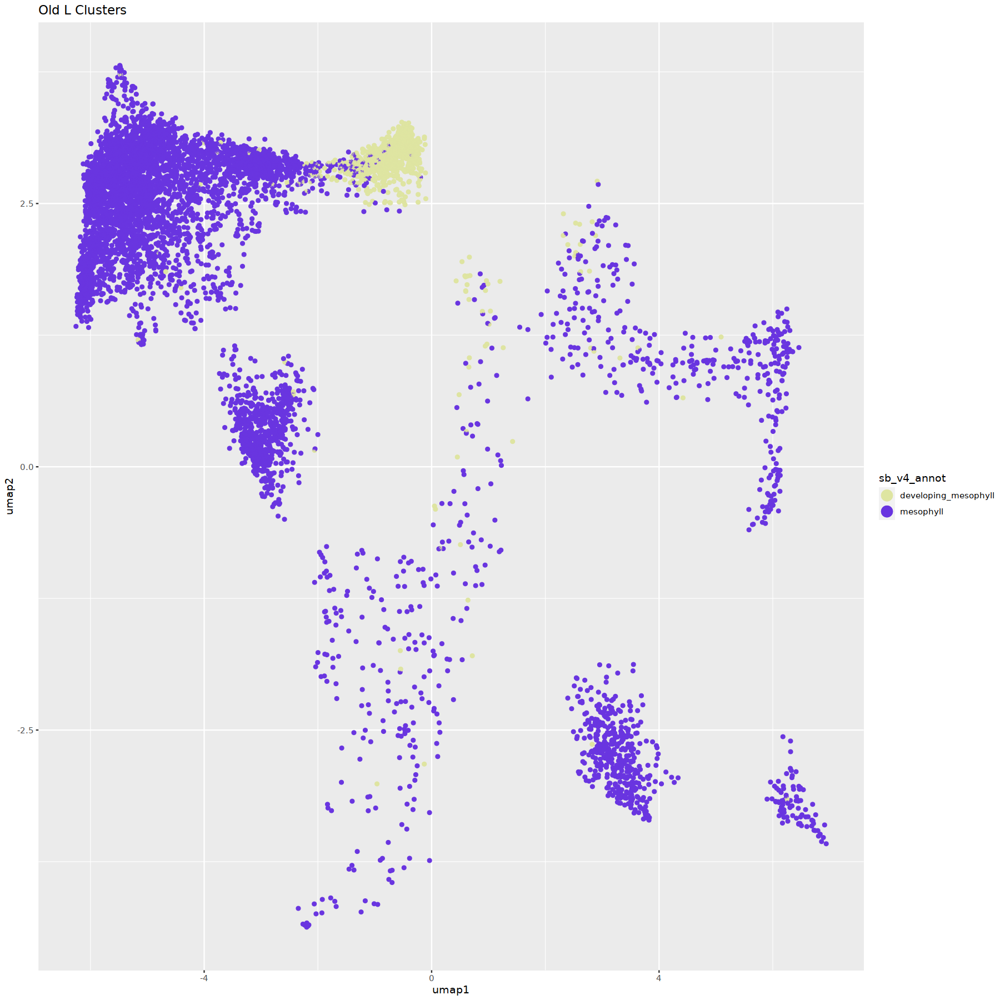

In [7]:
library(cowplot)
library(randomcoloR)
library(dplyr)
options(repr.plot.width=15, repr.plot.height=15)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)


Sb.subcluster <- Sb.subcluster
Sb.subcluster$meta <- v4.annot

#clusters <- c("Louvain_c10","Louvain_c19","Louvain_c21","Louvain_c23","Louvain_c18","Louvain_c10",
#  "Louvain_c28","Louvain_c2","Louvain_c23","Louvain_c11","Louvain_c24")


Sb.subcluster.mesophyll <- Sb.subcluster

Sb.subcluster.mesophyll$meta  %>% 
    filter(sb_v4_annot == "mesophyll" | sb_v4_annot ==  "developing_mesophyll")  %>% 
    ggplot(., aes(umap1, umap2, color = sb_v4_annot)) + geom_point() +
 scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Old L Clusters")

chosen_subcluster <- Sb.subcluster.mesophyll$meta %>% 
    filter(sb_v4_annot == "mesophyll" | sb_v4_annot ==  "developing_mesophyll")

In [8]:
meta_df <- as.data.frame(chosen_subcluster)
rownames(meta_df) <- meta_df$cellID
Sb.subcluster.mesophyll$meta <- meta_df
Sb.subcluster.mesophyll$meta.v3 <- meta_df
Sb.subcluster.mesophyll$acr <- read.table("/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/Sb.Louvain_cluster.iter_1/Sb.V3_annot.500bp_peaks.bed")

In [9]:
Sb.subcluster.mesophyll <- generateMatrix(Sb.subcluster.mesophyll, 
                                              filtered=FALSE,
                                              peaks = TRUE,
                                              organelle_scaffolds= c("Pt", "Mt"),
                                              blacklist = "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/sb_prelim.final_blacklist.bed",
                                              verbose=TRUE)

Sb.subcluster.mesophyll <- convertSparseData(Sb.subcluster.mesophyll, verbose = TRUE)

 - converting triplet format to sparseMatrix



In [10]:
# clean sparse counts matrix ---------------------------------------------
Sb.subcluster_mesophyll.clean <- cleanData(Sb.subcluster.mesophyll, 
                     min.c = 20,
                     min.t=0.05,  # minimum feature frequency across cells
                     max.t=0.3, # maximum feature frequency across cells
                     verbose=T)

   * Input: cells = 6750 | peaks = 69875

   * Filtered: cells = 6713 | peaks = 6583



In [11]:
# normalize with TFIDF ---------------------------------------------------
sb.subcluster_mesophyll.clean <- tfidf(Sb.subcluster_mesophyll.clean)

# project with NMF -------------------------------------------------------
sb.subcluster_mesophyll.clean <- reduceDims(sb.subcluster_mesophyll.clean,
                      method="SVD", 
                      n.pcs=50, 
                      num.var=NULL,
                      doL2=TRUE,
                      svd_slotName="SVD")

# reduce to 2-dimensions with UMAP ---------------------------------------
sb.subcluster_mesophyll.clean <- projectUMAP(sb.subcluster_mesophyll.clean, 
                       verbose=T,
                       k.near=15,
                       m.dist=0.01,
                       svd_slotName="SVD")

library(randomcoloR)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)


# identify clusters using neighborhood graph -----------------------------
sb.subcluster_mesophyll.clean.clusters <- callClusters(sb.subcluster_mesophyll.clean, 
                        res=2.5,
                        k.near = 15,
                        min.reads=500,
                        verbose=T,
                        svd_slotName= "SVD",
                        cluster_slotName="sub_cluster_mesophyll",
                        cleanCluster=FALSE)

 - non-linear dimensionality reduction with UMAP ...

08:49:17 UMAP embedding parameters a = 1.896 b = 0.8006

08:49:17 Read 6713 rows and found 49 numeric columns

08:49:17 Using Annoy for neighbor search, n_neighbors = 15

08:49:17 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:49:18 Writing NN index file to temp file /tmp/Rtmply6rny/file50d157252892

08:49:18 Searching Annoy index using 32 threads, search_k = 1500

08:49:18 Annoy recall = 100%

08:49:26 Commencing smooth kNN distance calibration using 32 threads
 with target n_neighbors = 15

08:49:30 Initializing from normalized Laplacian + noise (using irlba)

08:49:30 Commencing optimization for 500 epochs, with 144582 positive edges

08:49:47 Optimization finished

 - filtering outliers in UMAP manifold (z-s

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6583
Number of edges: 216809

Running Louvain algorithm...
Maximum modularity in 100 random starts: 0.5667
Number of communities: 14
Elapsed time: 5 seconds


 - finished graph-based clustering ...

 - filtering clusters with low cell/read counts ...



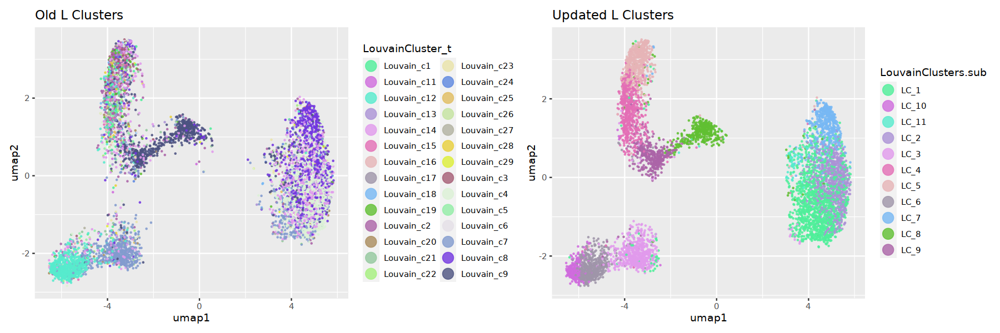

In [12]:
options(repr.plot.width=15, repr.plot.height=5)
old_clusters <- ggplot(sb.subcluster_mesophyll.clean$meta, aes(x=umap1, y = umap2, color = LouvainCluster_t)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

safe_LC <- sb.subcluster_mesophyll.clean.clusters$sub_cluster_mesophyll   %>% 
    mutate(LouvainClusters.sub = str_c("LC", LouvainClusters, sep = "_"))


new_clusters <- ggplot(safe_LC, aes(x=umap1, y = umap2, color = LouvainClusters.sub)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Updated L Clusters")


old_clusters + new_clusters 


[1] "cellID"                 "total.x"                "tss.x"                 
 [4] "acrs.x"                 "ptmt.x"                 "nSites.x"              
 [7] "log10nSites.x"          "pTSS.x"                 "FRiP.x"                
[10] "pOrg.x"                 "tss_z.x"                "acr_z.x"               
[13] "sites_z.x"              "qc_check.x"             "background.x"          
[16] "cellbulk.x"             "is_cell.x"              "sampleID.x"            
[19] "umap1.x"                "umap2.x"                "doubletscore.x"        
[22] "d.type.x"               "LouvainClusters.x"      "LouvainCluster_t.x"    
[25] "louvain_clusters_sub.x" "sb_v4_annot.x"          "total_cell_count.x"    
[28] "v4_annotation_n.x"      "total.y"                "tss.y"                 
[31] "acrs.y"                 "ptmt.y"                 "nSites.y"              
[34] "log10nSites.y"          "pTSS.y"                 "FRiP.y"                
[37] "pOrg.y"                 "tss_z.y"                "acr_z.y"               
[40] "sites_z.y"              "qc_check.y"             "background.y"          
[43] "cellbulk.y"             "is_cell.y"              "sampleID.y"            
[46] "umap1.y"                "umap2.y"                "doubletscore.y"        
[49] "d.type.y"               "LouvainClusters.y"      "LouvainCluster_t.y"    
[52] "louvain_clusters_sub.y" "sb_v4_annot.y"          "total_cell_count.y"    
[55] "v4_annotation_n.y"      "LouvainClusters.sub"

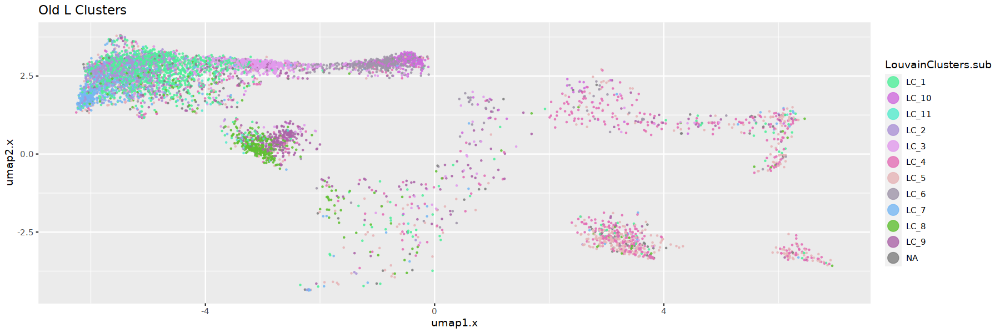

In [13]:
combined_old_new <- left_join(meta_df, safe_LC, by = "cellID")
colnames(combined_old_new)

old_umap_new_clusters <- ggplot(combined_old_new, aes(x=umap1.x, y = umap2.x, color = LouvainClusters.sub)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

old_umap_new_clusters

In [15]:
setwd("/scratch/jpm73279/comparative_single_cell/dev_location")
sb.subcluster_mesophyll.clean.clusters$all_genes <- "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/Sbicolorv5.1.gene.bed"
#bed_intersections <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/zea_mays/Zm.all_mergeed_repds.unique.mpq10.tn5.sorted.bed"
genome_file <- "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/Sorghum_bicolor_var_BTx623.mainGenome.MtPt.fasta.fai"
    
### Kernal Corrupted to just linked to the previosly run gene body accessability calculations
sb.subcluster_mesophyll.clean.clusters.counts <- sb.subcluster_mesophyll.clean.clusters
sb.subcluster_mesophyll.clean.clusters.counts$acr_counts_raw <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/Sb.Louvain_cluster.iter_1/sb.gene_accessability.iter_1.scores.txt"



## Execute Annotation Attempt #1

library(presto)
sb.subcluster_mesophyll.clean.clusters.final <- run_presto(sb.subcluster_mesophyll.clean.clusters.counts,
           meta_slot = "sub_cluster_mesophyll",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")

grabbed_top_marker_per_cluster <- top_markers(sb.subcluster_mesophyll.clean.clusters.final$presto_marker, 200)

# A tibble: 6 × 28
  cellID      total   tss  acrs  ptmt nSites log10…¹  pTSS  FRiP    pOrg   tss_z
  <chr>       <int> <int> <int> <int>  <dbl>   <dbl> <dbl> <dbl>   <dbl>   <dbl>
1 BC:Z:ACAGT… 46581 19137 13629 13255   6514    3.81 0.411 0.293 0.285   -0.281 
2 BC:Z:ACAGT… 20177 11434 15385   489   6435    3.81 0.567 0.763 0.0242   0.192 
3 BC:Z:TTAGG… 17220  5594  2737  2179   1660    3.22 0.325 0.159 0.127   -0.542 
4 BC:Z:TGACC… 18591 11447 15717   132   6116    3.79 0.616 0.845 0.00710  0.340 
5 BC:Z:TGACC… 15302  7635  7987   678   3470    3.54 0.499 0.522 0.0443  -0.0140
6 BC:Z:TGACC… 10995  5699  6895   510   2940    3.47 0.518 0.627 0.0464   0.0448
# … with 17 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <int>,
#   background <dbl>, cellbulk <dbl>, is_cell <int>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   LouvainClusters <fct>, LouvainCluster_t <chr>, louvain_clusters_sub <chr>,
#   sb_v4_annot <chr>, total_cell_count <int>, v4

In [31]:
represented_marker_lst <- list()
for (i in unique(sb.subcluster_mesophyll.clean.clusters.final$sub_cluster_mesophyll$LouvainClusters)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(grabbed_top_marker_per_cluster, 
                                           marker_list_sb, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    represented_marker_lst[[i]] <- markers_present_in_presto
}
                 
represented_marker_lst

ERROR: [1m[33mError[39m in `left_join()`:[22m
[1m[22m[33m![39m Join columns must be present in data.
[31m✖[39m Problem with `5`.


In [17]:
gathered_markers <- bind_rows(represented_marker_lst, .id = "LouvainCluster")  %>% 
    arrange(LouvainCluster, rank)

In [22]:
sb.mesophyll_annot <- as_tibble(sb.subcluster_mesophyll.clean.clusters.final$sub_cluster_mesophyll)

sb.mesophyll_sub_annot <- sb.mesophyll_annot %>% 
    dplyr::mutate(sb.mesophyll_lc = str_c("LC", LouvainClusters, sep = "_")) %>%     
    dplyr::mutate(sb_v4_annot.subcluster_v2 = NA)  %>% 
    dplyr::mutate(sb_v4_annot.subcluster_v2 = case_when(sb.mesophyll_lc %in% c("LC_4", "LC_5") ~ "epidermis",
                                                        sb.mesophyll_lc %in% c("LC_8") ~ "developing_mesophyll",
                                                        sb.mesophyll_lc %in% c("LC_9") ~ "protoderm",
                                                        sb.mesophyll_lc %in% c("LC_1", "LC_11", "LC_2", "LC_7") ~ "mesophyll",

                                                        TRUE ~ "unknown_clusters"))

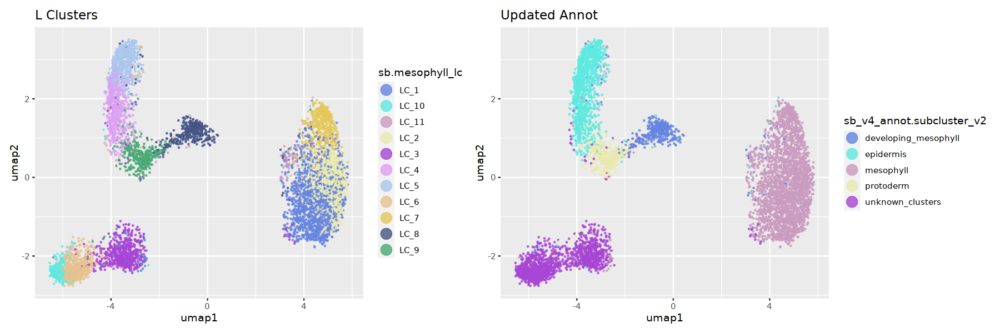

In [23]:
LC_meso <- ggplot(sb.mesophyll_sub_annot, aes(x=umap1, y = umap2, color = sb.mesophyll_lc)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("L Clusters")

meso_annot <- ggplot(sb.mesophyll_sub_annot, aes(x=umap1, y = umap2, color = sb_v4_annot.subcluster_v2)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Annot")

LC_meso + meso_annot

In [ ]:
# Merging 3/5/11
library(presto)

sb.subcluster_mesophyll.clean.clusters.counts$meso_annot <- sb.mesophyll_sub_annot

sb.subcluster_mesophyll.clean.clusters.final <- run_presto(sb.subcluster_mesophyll.clean.clusters.counts,
           meta_slot = "meso_annot",
           counts_raw = "acr_counts_raw",
           cluster_name = "sb_v4_annot.subcluster_v2")

meso_sub_annot.top_markers <- top_markers(sb.subcluster_mesophyll.clean.clusters.final$presto_marker, 200)

In [30]:
meso.sub_marker_list <- list()
for (i in unique(sb.subcluster_mesophyll.clean.clusters.final$meso_annot$sb_v4_annot.subcluster_v2)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(meso_sub_annot.top_markers, 
                                           marker_list_sb, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    meso.sub_marker_list[[i]] <- markers_present_in_presto
}
                 
meso.sub_marker_list

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
2,Sobic.002G207900,Chr02,61233338,61239219,gl1,epidermis,axillaryBud;leaf;crownRoot;root
15,Sorbiv5.1_pg1301.valid.m1.g,Chr01,76380925,76385283,Zm00001eb009780_pval_0_epidermal_ncell_3135,epidermal_ncell_3135,leaf
43,Sobic.009G036800,Chr09,3511904,3515731,Zm00001eb354450_pval_0.0219_subsidary_cell_ncell_117,subsidary_cell_ncell_117,leaf
69,Sorbiv5.1_pg15531.m1.g,Chr03,3341071,3347117,me3_ortho_count_1,bundle_sheath,axillaryBud;leaf
94,Sorbiv5.1_pg5044.valid.m7.g,Chr01,66616555,66619678,bk1,vascular_sclerenchyma,axillaryBud;leaf;crownRoot;root;tassel;ear
187,Sorbiv5.1_pg18563.valid.m1.g,Chr07,6900132,6906079,ocl5,"protoderm,L1_SAM,L1_leaf_primordia,L1_inflorescence_meristem,L1_spikelet_pair_meristem,L1_spikelet_meristem,L1_upper_floral_meristem,L1_lower_floral_meristem,L1_pistil_primordia,L1_stamen_primordia,L1_palea_primordia,L1_lemma_primordia,L1_glume_primordia,L1_branch_meristem",axillaryBud;leaf;tassel;ear
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,Sobic.010G160700,Chr10,48834723,48842334,pepc1,mesophyll,axillaryBud;leaf


In [34]:
gathered_markers <- bind_rows(meso.sub_marker_list, .id = "LouvainCluster")  %>% 
    arrange(LouvainCluster, rank)


gathered_markers

LouvainCluster,rank,geneID,chr,start,end,name,type,tissue
<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
developing_mesophyll,5,Sobic.001G160200,Chr01,13278291,13284429,Zm00001eb050930_pval_0_protoderm_ncell_1292,protoderm_ncell_1292,leaf
developing_mesophyll,41,Sorbiv5.1_pg15362.valid.m24.g,Chr03,63610236,63623676,cah1,mesophyll,axillaryBud;leaf
developing_mesophyll,67,Sobic.008G193300,Chr08,65745228,65750046,sut2,"companion_cells,xylem_parenchyma,phloem_parenchyma,pith_parenchyma",axillaryBud;leaf;crownRoot;root;tassel;ear
developing_mesophyll,135,Sobic.009G200200,Chr09,58778760,58787782,Zm00001eb353280_pval_0_companion_cells_ncell_647__Zm00001eb293110_pval_0_companion_cells_ncell_647,companion_cells_ncell_647,leaf
epidermis,2,Sobic.002G207900,Chr02,61233338,61239219,gl1,epidermis,axillaryBud;leaf;crownRoot;root
epidermis,15,Sorbiv5.1_pg1301.valid.m1.g,Chr01,76380925,76385283,Zm00001eb009780_pval_0_epidermal_ncell_3135,epidermal_ncell_3135,leaf
epidermis,43,Sobic.009G036800,Chr09,3511904,3515731,Zm00001eb354450_pval_0.0219_subsidary_cell_ncell_117,subsidary_cell_ncell_117,leaf
epidermis,69,Sorbiv5.1_pg15531.m1.g,Chr03,3341071,3347117,me3_ortho_count_1,bundle_sheath,axillaryBud;leaf
epidermis,94,Sorbiv5.1_pg5044.valid.m7.g,Chr01,66616555,66619678,bk1,vascular_sclerenchyma,axillaryBud;leaf;crownRoot;root;tassel;ear


In [26]:
sb.subcluster_mesophyll.clean.clusters.final$sub_cluster_mesophyll$sb_v4_annot.subcluster_v2

NULL

Rows: 14947 Columns: 25
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (13): cellID, sampleID, d.type, cell_annotation_glmnet, cell_annotation_...
dbl (12): total, tss, acrs, ptmt, nSites, log10nSites, umap1, umap2, doublet...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


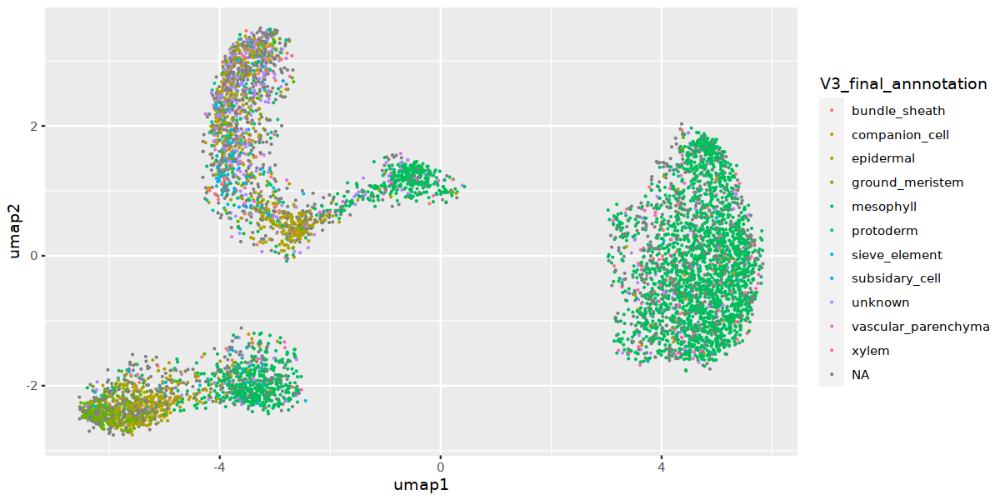

In [35]:
# Copmare with previous Annotation
options(repr.plot.width=10, repr.plot.height=5)
sb_annotation_v3 <- read_tsv("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/sb_annot_v3/Sb_leaf.V3_final.txt") 
                                    
sb_annotation_v3.final <- sb_annotation_v3  %>% 
    dplyr::select(cellID, V3_final_annnotation)

final_combined <- left_join(sb.subcluster_mesophyll.clean.clusters.final$sub_cluster_mesophyll, sb_annotation_v3.final, by = "cellID")

ggplot(final_combined ,aes(umap1, umap2, color = V3_final_annnotation)) + 
    geom_jitter(size = .1)

In [42]:
colnames(sb.subcluster_mesophyll.clean.clusters.final$meso_annot)

[1] "cellID"                    "total"                    
 [3] "tss"                       "acrs"                     
 [5] "ptmt"                      "nSites"                   
 [7] "log10nSites"               "pTSS"                     
 [9] "FRiP"                      "pOrg"                     
[11] "tss_z"                     "acr_z"                    
[13] "sites_z"                   "qc_check"                 
[15] "background"                "cellbulk"                 
[17] "is_cell"                   "sampleID"                 
[19] "umap1"                     "umap2"                    
[21] "doubletscore"              "d.type"                   
[23] "LouvainClusters"           "LouvainCluster_t"         
[25] "louvain_clusters_sub"      "sb_v4_annot"              
[27] "total_cell_count"          "v4_annotation_n"          
[29] "sb.mesophyll_lc"           "sb_v4_annot.subcluster_v2"

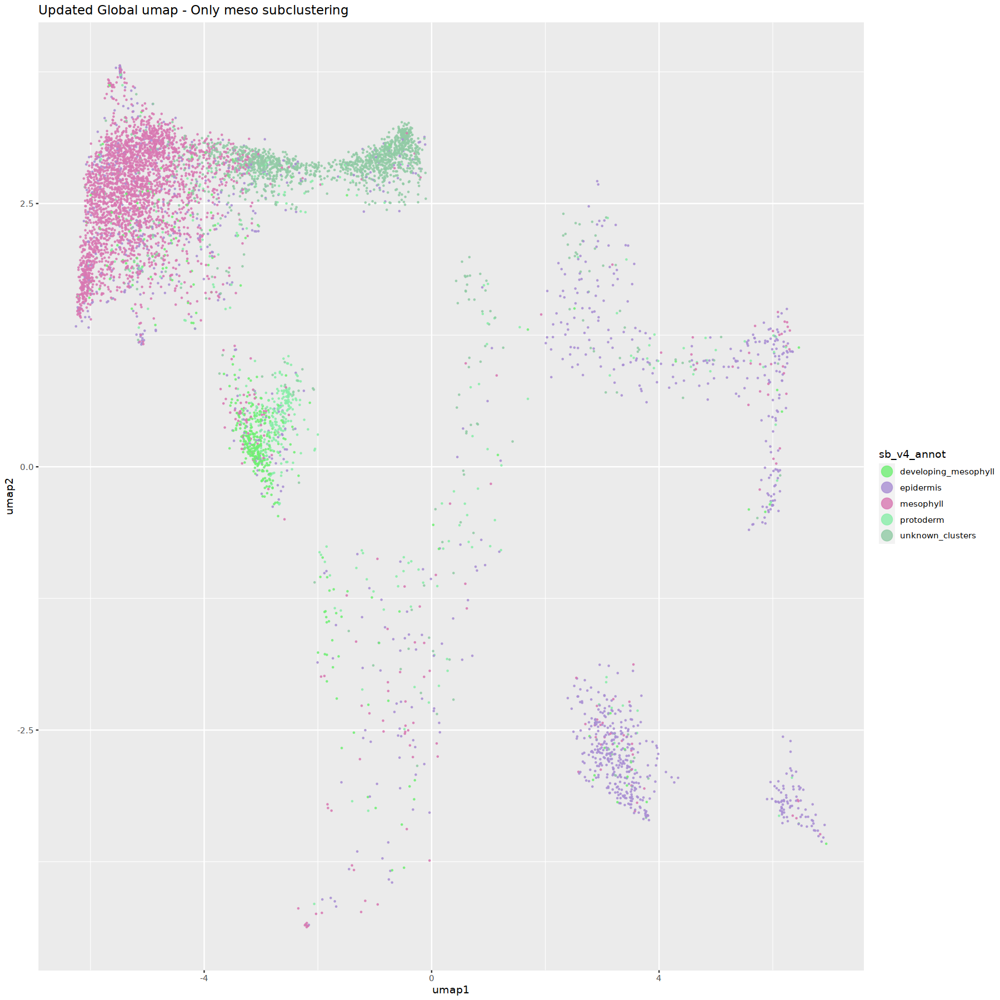

In [61]:
sb.subcluster_meso_updated_annotations <- sb.subcluster_mesophyll.clean.clusters.final$meso_annot  %>% 
    dplyr::mutate(sb_v4_annot = sb_v4_annot.subcluster_v2)  %>% 
    dplyr::select(-total_cell_count, -v4_annotation_n)  %>% 
    mutate(across(c(LouvainClusters),factor))  %>% 
    dplyr::select(cellID, sb_v4_annot, sb_v4_annot.subcluster_v2, sb.mesophyll_lc)


sb.subcluster_mesophyll.final_meta <- v4.annot  %>% 
    dplyr::filter(cellID %in% sb.subcluster_mesophyll.final_meta$cellID)  %>% 
    dplyr::select(-total_cell_count, -v4_annotation_n, -sb_v4_annot)  %>%
    left_join(., sb.subcluster_meso_updated_annotations, by = "cellID")  %>% 
    mutate(across(c(LouvainClusters),factor))
    

global_umap_only_mesophyll <- ggplot(sb.subcluster_mesophyll.final_meta, aes(x=umap1, y = umap2, color = sb_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Global umap - Only meso subclustering")

global_umap_only_mesophyll


In [54]:
dim(sb.subcluster_meso_updated_annotations)
dim(sb.subcluster_mesophyll.final_meta)
colnames(sb.subcluster_mesophyll.final_meta)

[1] 6557    4

[1] 6557   28

[1] "cellID"                    "total"                    
 [3] "tss"                       "acrs"                     
 [5] "ptmt"                      "nSites"                   
 [7] "log10nSites"               "pTSS"                     
 [9] "FRiP"                      "pOrg"                     
[11] "tss_z"                     "acr_z"                    
[13] "sites_z"                   "qc_check"                 
[15] "background"                "cellbulk"                 
[17] "is_cell"                   "sampleID"                 
[19] "umap1"                     "umap2"                    
[21] "doubletscore"              "d.type"                   
[23] "LouvainClusters"           "LouvainCluster_t"         
[25] "louvain_clusters_sub"      "sb_v4_annot"              
[27] "sb_v4_annot.subcluster_v2" "sb.mesophyll_lc"

In [57]:
`%ni%` <- Negate(`%in%`)

v4_annot_filtered_cells <- v4.annot  %>% 
    dplyr::filter(cellID %ni% sb.subcluster_mesophyll.clean.clusters.final$meso_annot$cellID)  %>% 
    dplyr::select(-total_cell_count, -v4_annotation_n)  %>% 
      mutate(across(c(LouvainClusters),factor))


sb.combined_meso.sb <- bind_rows(v4_annot_filtered_cells, sb.subcluster_mesophyll.final_meta)

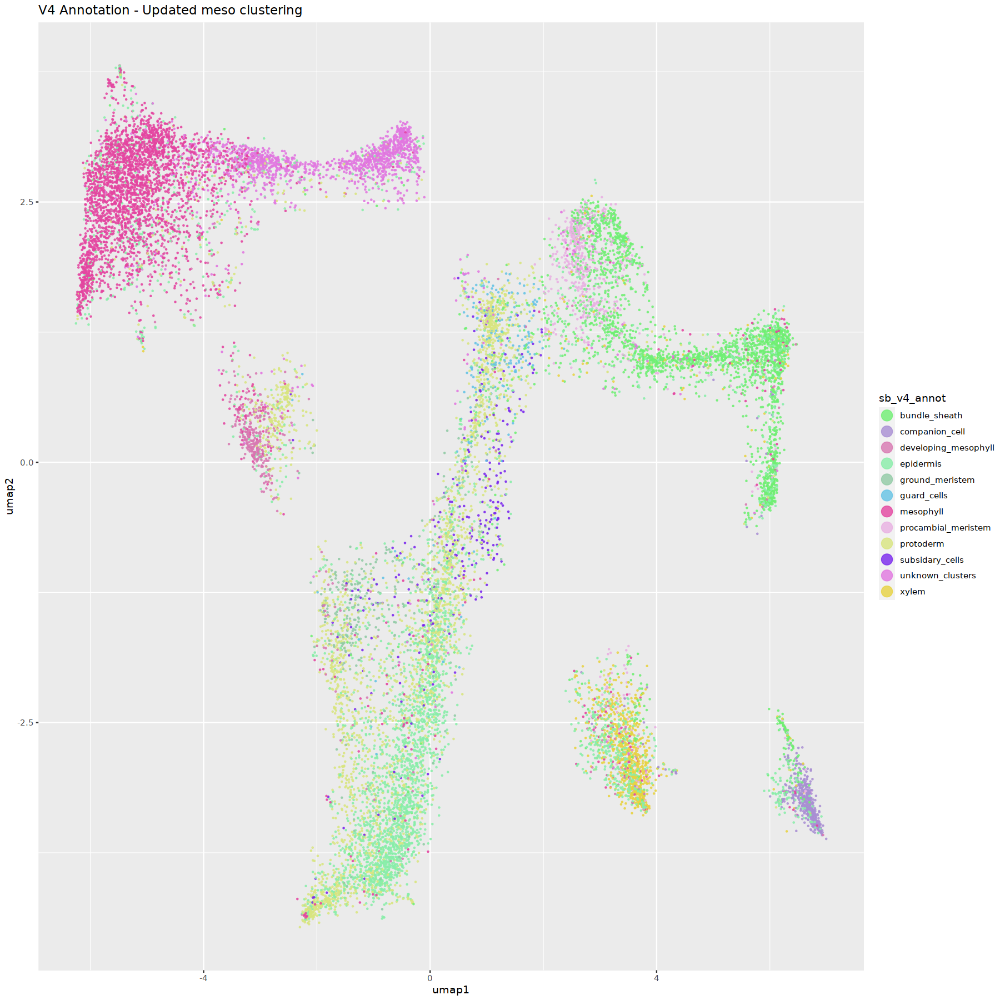

In [58]:
updated_meso_annot_global <- ggplot(sb.combined_meso.sb, aes(x=umap1, y = umap2, color = sb_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("V4 Annotation - Updated meso clustering")

updated_meso_annot_global

In [130]:



write_delim(sb.combined_meso.sb, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/sb_annot_v4/Sb.leaf_annot.V4.meta.final.updated_meso_subclustering.txt",
                       col_names = TRUE, quote = "none", delim = "\t")


prefix <- "Sb_leaf.merged_replicates.subclustering_mesophyll.V4"
output_location <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/v4_annotation_refinment"
sb.subcluster_mesophyll.clean.clusters.final$meta_final_post_annot <- sb.combined_meso.sb
saveRDS(sb.subcluster_mesophyll.clean.clusters.final, file = paste0(output_location,prefix,".rds"))


# Working on Epidermal Lineage

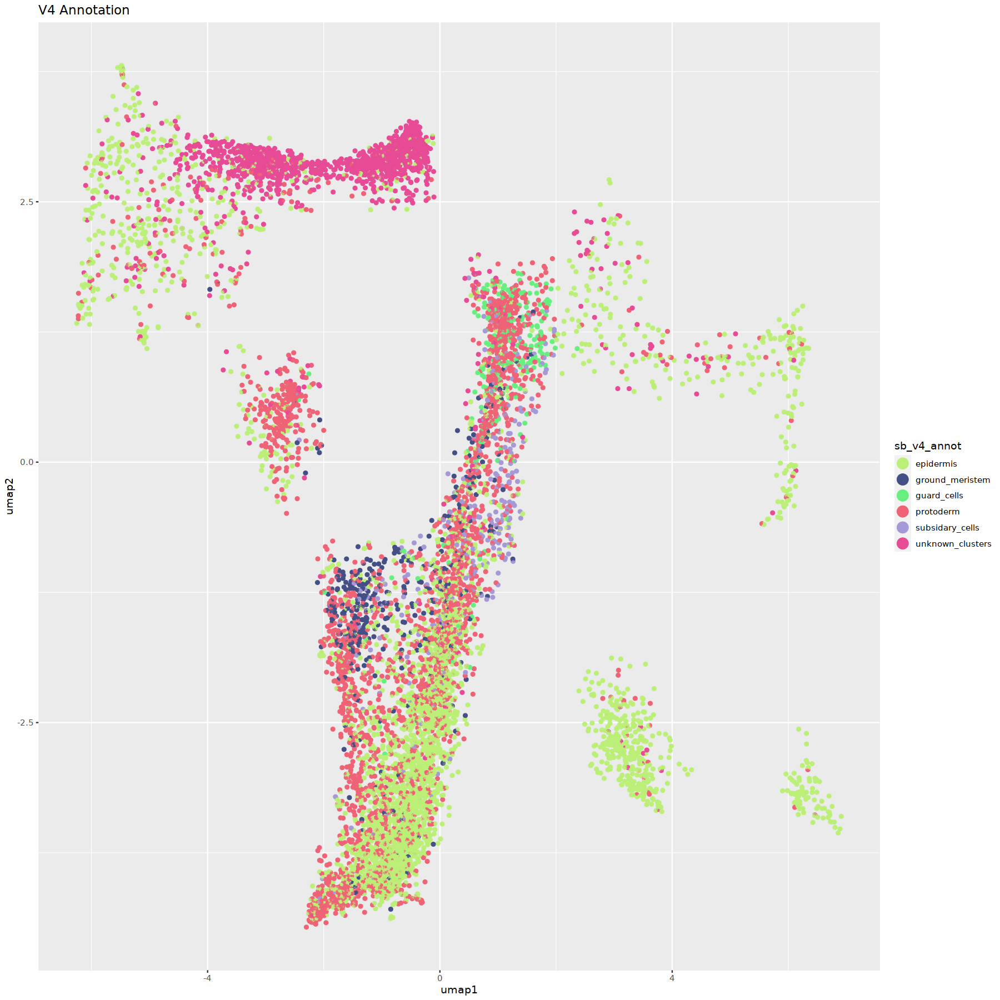

In [104]:
library(cowplot)
library(randomcoloR)
library(dplyr)
options(repr.plot.width=15, repr.plot.height=15)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)


#clusters <- c("Louvain_c10","Louvain_c19","Louvain_c21","Louvain_c23","Louvain_c18","Louvain_c10",
#  "Louvain_c28","Louvain_c2","Louvain_c23","Louvain_c11","Louvain_c24")


Sb.subcluster.epidermis <- Sb.subcluster
Sb.subcluster.epidermis$meta <- sb.combined_meso.sb

Sb.subcluster.epidermis$meta  %>% 
    filter(sb_v4_annot == "epidermis" | sb_v4_annot ==  "protoderm" | sb_v4_annot == "unknown_clusters" |
           sb_v4_annot ==  "ground_meristem" | sb_v4_annot ==  "subsidary_cells" | sb_v4_annot ==  "guard_cells")  %>% 
    ggplot(., aes(umap1, umap2, color = sb_v4_annot)) + geom_point() +
 scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("V4 Annotation")

chosen_subcluster <- Sb.subcluster.epidermis$meta %>% 
    filter(sb_v4_annot == "epidermis" | sb_v4_annot ==  "protoderm" |  sb_v4_annot == "unknown_clusters" |
           sb_v4_annot ==  "ground_meristem" | sb_v4_annot ==  "subsidary_cells" | sb_v4_annot ==  "guard_cells")

In [105]:
meta_df <- as.data.frame(chosen_subcluster)
rownames(meta_df) <- meta_df$cellID
Sb.subcluster.epidermis$meta <- meta_df
Sb.subcluster.epidermis$meta.v3 <- meta_df
Sb.subcluster.epidermis$acr <- read.table("/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/Sb.Louvain_cluster.iter_1/Sb.V3_annot.500bp_peaks.bed")

Sb.subcluster.epidermis <- generateMatrix(Sb.subcluster.epidermis, 
                                              filtered=FALSE,
                                              peaks = TRUE,
                                              organelle_scaffolds= c("Pt", "Mt"),
                                              blacklist = "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/sb_prelim.final_blacklist.bed",
                                              verbose=TRUE)

Sb.subcluster.epidermis <- convertSparseData(Sb.subcluster.epidermis, verbose = TRUE)

 - converting triplet format to sparseMatrix



In [106]:
# clean sparse counts matrix ---------------------------------------------
Sb.subcluster_epidermis.clean <- cleanData(Sb.subcluster.epidermis, 
                     min.c = 20,
                     min.t=0.01,  # minimum feature frequency across cells
                     max.t=0.50, # maximum feature frequency across cells
                     verbose=T)

   * Input: cells = 8871 | peaks = 69875

   * Filtered: cells = 8816 | peaks = 6832



In [109]:
# normalize with TFIDF ---------------------------------------------------
sb.subcluster_epidermis.clean <- tfidf(Sb.subcluster_epidermis.clean)

# project with NMF -------------------------------------------------------
sb.subcluster_epidermis.clean <- reduceDims(sb.subcluster_epidermis.clean,
                      method="SVD", 
                      n.pcs=50, 
                      num.var=NULL,
                      doL2=TRUE,
                      svd_slotName="SVD")

# reduce to 2-dimensions with UMAP ---------------------------------------
sb.subcluster_epidermis.clean <- projectUMAP(sb.subcluster_epidermis.clean, 
                       verbose=T,
                       k.near=15,
                       m.dist=0.01,
                       svd_slotName="SVD")

library(randomcoloR)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)

 - non-linear dimensionality reduction with UMAP ...

14:04:06 UMAP embedding parameters a = 1.896 b = 0.8006

14:04:06 Read 8816 rows and found 49 numeric columns

14:04:06 Using Annoy for neighbor search, n_neighbors = 15

14:04:06 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:04:07 Writing NN index file to temp file /tmp/Rtmply6rny/file50d157cb44a5

14:04:07 Searching Annoy index using 32 threads, search_k = 1500

14:04:07 Annoy recall = 100%

14:04:09 Commencing smooth kNN distance calibration using 32 threads
 with target n_neighbors = 15

14:04:11 Initializing from normalized Laplacian + noise (using irlba)

14:04:11 Commencing optimization for 500 epochs, with 208026 positive edges

14:04:34 Optimization finished



 - filtering outliers in UMAP manifold (z-score e.thresh = 3) ...

 - creating seurat object for graph-based clustering ...

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 8632
Number of edges: 405256

Running Louvain algorithm...
Maximum modularity in 100 random starts: 0.7975
Number of communities: 12
Elapsed time: 7 seconds


 - finished graph-based clustering ...

 - filtering clusters with low cell/read counts ...



[1] "cellID"                      "total.x"                    
 [3] "tss.x"                       "acrs.x"                     
 [5] "ptmt.x"                      "nSites.x"                   
 [7] "log10nSites.x"               "pTSS.x"                     
 [9] "FRiP.x"                      "pOrg.x"                     
[11] "tss_z.x"                     "acr_z.x"                    
[13] "sites_z.x"                   "qc_check.x"                 
[15] "background.x"                "cellbulk.x"                 
[17] "is_cell.x"                   "sampleID.x"                 
[19] "umap1.x"                     "umap2.x"                    
[21] "doubletscore.x"              "d.type.x"                   
[23] "LouvainClusters.x"           "LouvainCluster_t.x"         
[25] "louvain_clusters_sub.x"      "sb_v4_annot.x"              
[27] "sb_v4_annot.subcluster_v2.x" "sb.mesophyll_lc.x"          
[29] "total.y"                     "tss.y"                      
[31] "acrs.y"                      "ptmt.y"                     
[33] "nSites.y"                    "log10nSites.y"              
[35] "pTSS.y"                      "FRiP.y"                     
[37] "pOrg.y"                      "tss_z.y"                    
[39] "acr_z.y"                     "sites_z.y"                  
[41] "qc_check.y"                  "background.y"               
[43] "cellbulk.y"                  "is_cell.y"                  
[45] "sampleID.y"                  "umap1.y"                    
[47] "umap2.y"                     "doubletscore.y"             
[49] "d.type.y"                    "LouvainClusters.y"          
[51] "LouvainCluster_t.y"          "louvain_clusters_sub.y"     
[53] "sb_v4_annot.y"               "sb_v4_annot.subcluster_v2.y"
[55] "sb.mesophyll_lc.y"           "LouvainClusters.sub"

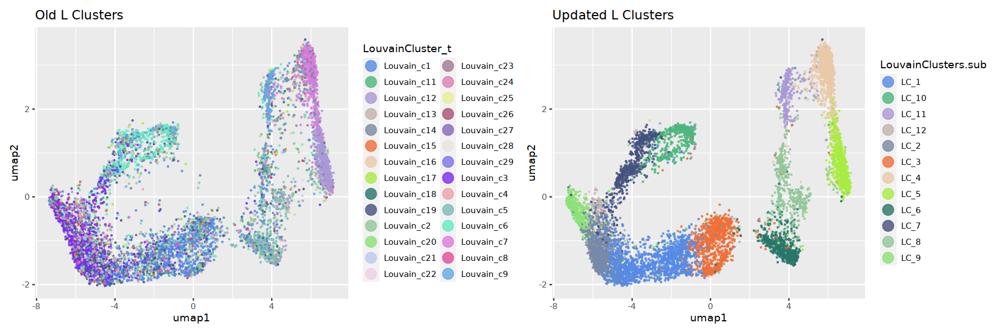

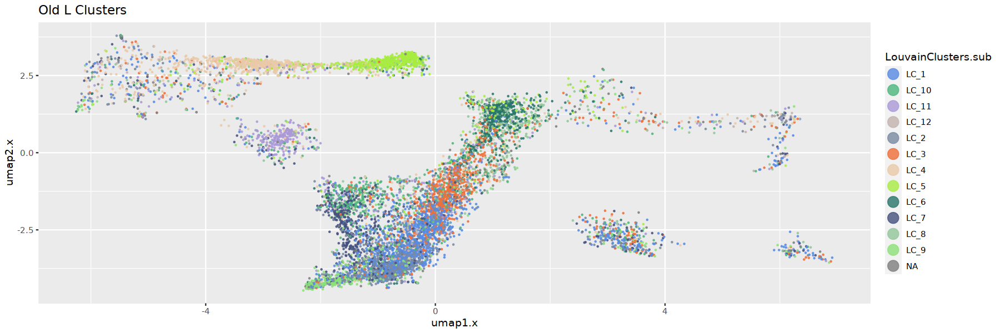

In [110]:
# identify clusters using neighborhood graph -----------------------------
sb.subcluster_epidermis.clean.clusters <- callClusters(sb.subcluster_epidermis.clean, 
                        res=1.2,
                        k.near = 15,
                        min.reads=500,
                        verbose=T,
                        svd_slotName= "SVD",
                        cluster_slotName="sub_cluster_epidermis",
                        cleanCluster=FALSE)

options(repr.plot.width=15, repr.plot.height=5)
old_clusters <- ggplot(sb.subcluster_epidermis.clean$meta, aes(x=umap1, y = umap2, color = LouvainCluster_t)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

safe_LC <- sb.subcluster_epidermis.clean.clusters$sub_cluster_epidermis   %>% 
    mutate(LouvainClusters.sub = str_c("LC", LouvainClusters, sep = "_"))


new_clusters <- ggplot(safe_LC, aes(x=umap1, y = umap2, color = LouvainClusters.sub)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Updated L Clusters")


old_clusters + new_clusters 


combined_old_new <- left_join(meta_df, safe_LC, by = "cellID")
colnames(combined_old_new)

old_umap_new_clusters <- ggplot(combined_old_new, aes(x=umap1.x, y = umap2.x, color = LouvainClusters.sub)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

old_umap_new_clusters

In [111]:
setwd("/scratch/jpm73279/comparative_single_cell/dev_location")
sb.subcluster_epidermis.clean.clusters$all_genes <- "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/Sbicolorv5.1.gene.bed"
#bed_intersections <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/zea_mays/Zm.all_mergeed_repds.unique.mpq10.tn5.sorted.bed"
genome_file <- "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/Sorghum_bicolor_var_BTx623.mainGenome.MtPt.fasta.fai"
    
### Kernal Corrupted to just linked to the previosly run gene body accessability calculations
sb.subcluster_epidermis.clean.clusters.counts <- sb.subcluster_epidermis.clean.clusters
sb.subcluster_epidermis.clean.clusters.counts$acr_counts_raw <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/Sb.Louvain_cluster.iter_1/sb.gene_accessability.iter_1.scores.txt"



## Execute Annotation Attempt #1

library(presto)
sb.subcluster_epidermis.clean.clusters.final <- run_presto(sb.subcluster_epidermis.clean.clusters.counts,
           meta_slot = "sub_cluster_epidermis",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")

grabbed_top_marker_per_cluster <- top_markers(sb.subcluster_epidermis.clean.clusters.final$presto_marker, 200)
represented_marker_lst <- list()
for (i in unique(sb.subcluster_epidermis.clean.clusters.final$sub_cluster_epidermis$LouvainClusters)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(grabbed_top_marker_per_cluster, 
                                           marker_list_sb, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    represented_marker_lst[[i]] <- markers_present_in_presto
}
                 
represented_marker_lst

# A tibble: 6 × 28
  cellID      total   tss  acrs  ptmt nSites log10…¹  pTSS   FRiP    pOrg  tss_z
  <chr>       <int> <int> <int> <int>  <dbl>   <dbl> <dbl>  <dbl>   <dbl>  <dbl>
1 BC:Z:TTAGG… 13582  6280  6249   452   2978    3.47 0.462 0.460  0.0333  -0.125
2 BC:Z:ATCAC… 13998  8760 11724   170   4632    3.67 0.626 0.838  0.0121   0.371
3 BC:Z:ATCAC… 12819  8006 11082   177   4320    3.64 0.625 0.864  0.0138   0.367
4 BC:Z:ATCAC… 10648  2970   864   162    698    2.84 0.279 0.0811 0.0152  -0.682
5 BC:Z:CGATG… 10546  6606  9368    46   3789    3.58 0.626 0.888  0.00436  0.373
6 BC:Z:GCCAA…  9859  5980  8154   100   3547    3.55 0.607 0.827  0.0101   0.312
# … with 17 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <int>,
#   background <dbl>, cellbulk <dbl>, is_cell <int>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   LouvainClusters <fct>, LouvainCluster_t <chr>, louvain_clusters_sub <chr>,
#   sb_v4_annot <chr>, sb_v4_annot.subcluster_v2 

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
27,Sobic.002G207900,Chr02,61233338,61239219,gl1,epidermis,axillaryBud;leaf;crownRoot;root
65,Sorbiv5.1_pg9159.m1.g,Chr06,41574374,41588764,ba2,"axillary_meristem,branch_meristem,peripheral_zone_inflorescence_meristem,spikelet_pair_meristem,spikelet_meristem,upper_floral_meristem,lower_floral_meristem,pistil_primordia,stamen_primordia,provascular_strands,glume_primordia,lemma_primordia,palea_primordia",axillaryBud;leaf;tassel;ear
70,Sobic.002G343500,Chr02,72301461,72308725,ZmCPK37__ZmCPK35,guard_cell,axillaryBud;leaf
168,Sorbiv5.1_pg15809.valid.m1.g,Chr03,14388946,14396043,Zm00001eb130080_pval_0_protoderm_ncell_1292,protoderm_ncell_1292,leaf
193,Sorbiv5.1_pg26824.valid.m2.g,Chr02,72794498,72798197,Zm00001eb325230_pval_0_protoderm_ncell_1292,protoderm_ncell_1292,leaf
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,Sobic.002G207900,Chr02,61233338,61239219,gl1,epidermis,axillaryBud;leaf;crownRoot;root
65,Sorbiv5.1_pg1301.valid.m1.g,Chr01,76380925,76385283,Zm00001eb009780_pval_0_epidermal_ncell_3135,epidermal_ncell_3135,leaf


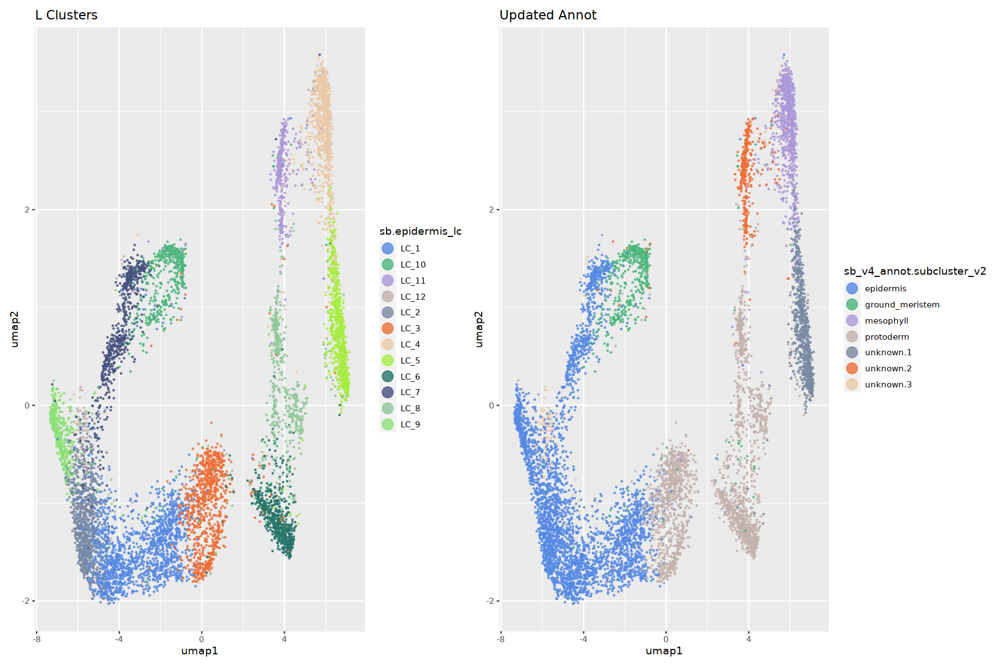

In [127]:
gathered_markers <- bind_rows(represented_marker_lst, .id = "LouvainCluster")  %>% 
    arrange(LouvainCluster, rank)

sb.epidermis_annot <- as_tibble(sb.subcluster_epidermis.clean.clusters.final$sub_cluster_epidermis)

sb.epidermis_sub_annot <- sb.epidermis_annot %>% 
    dplyr::mutate(sb.epidermis_lc = str_c("LC", LouvainClusters, sep = "_")) %>%     
    dplyr::mutate(sb_v4_annot.subcluster_v2 = NA)  %>% 
    dplyr::mutate(sb_v4_annot.subcluster_v2 = case_when(sb.epidermis_lc %in% c("LC_4") ~ "mesophyll",
                                                        sb.epidermis_lc %in% c("LC_3", "LC_6", "LC_8") ~ "protoderm",
                                                        sb.epidermis_lc %in% c("LC_10") ~ "ground_meristem",
                                                        sb.epidermis_lc %in% c("LC_5") ~ "unknown.1",
                                                        sb.epidermis_lc %in% c("LC_11") ~ "unknown.2",
                                                        sb.epidermis_lc %in% c("LC_12") ~ "unknown.3",
                                                        sb.epidermis_lc %in% c("LC_1", "LC_2", "LC_7", "LC_9") ~ "epidermis",
                                                        TRUE ~ "unknown_clusters"))

LC_epidermis <- ggplot(sb.epidermis_sub_annot, aes(x=umap1, y = umap2, color = sb.epidermis_lc)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("L Clusters")

epidermis_annot <- ggplot(sb.epidermis_sub_annot, aes(x=umap1, y = umap2, color = sb_v4_annot.subcluster_v2)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Annot")

LC_epidermis + epidermis_annot

ERROR: [1m[33mError[39m in `auto_copy()`:[22m
[1m[22m[33m![39m `x` and `y` must share the same src.
[36mℹ[39m set `copy` = TRUE (may be slow).


In [117]:
# Merging 3/5/11


sb.subcluster_epidermis.clean.clusters.counts$epidermis_annot <- sb.epidermis_sub_annot

sb.subcluster_epidermis.clean.clusters.final <- run_presto(sb.subcluster_epidermis.clean.clusters.counts,
           meta_slot = "epidermis_annot",
           counts_raw = "acr_counts_raw",
           cluster_name = "sb_v4_annot.subcluster_v2")

epidermis_sub_annot.top_markers <- top_markers(sb.subcluster_epidermis.clean.clusters.final$presto_marker, 200)

epidermis.sub_marker_list <- list()
for (i in unique(sb.subcluster_epidermis.clean.clusters.final$epidermis_annot$sb_v4_annot.subcluster_v2)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(epidermis_sub_annot.top_markers, 
                                           marker_list_sb, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    epidermis.sub_marker_list[[i]] <- markers_present_in_presto
}
                 
epidermis.sub_marker_list

# A tibble: 6 × 29
  cellID      total   tss  acrs  ptmt nSites log10…¹  pTSS   FRiP    pOrg  tss_z
  <chr>       <int> <int> <int> <int>  <dbl>   <dbl> <dbl>  <dbl>   <dbl>  <dbl>
1 BC:Z:TTAGG… 13582  6280  6249   452   2978    3.47 0.462 0.460  0.0333  -0.125
2 BC:Z:ATCAC… 13998  8760 11724   170   4632    3.67 0.626 0.838  0.0121   0.371
3 BC:Z:ATCAC… 12819  8006 11082   177   4320    3.64 0.625 0.864  0.0138   0.367
4 BC:Z:ATCAC… 10648  2970   864   162    698    2.84 0.279 0.0811 0.0152  -0.682
5 BC:Z:CGATG… 10546  6606  9368    46   3789    3.58 0.626 0.888  0.00436  0.373
6 BC:Z:GCCAA…  9859  5980  8154   100   3547    3.55 0.607 0.827  0.0101   0.312
# … with 18 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <int>,
#   background <dbl>, cellbulk <dbl>, is_cell <int>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   LouvainClusters <fct>, LouvainCluster_t <chr>, louvain_clusters_sub <chr>,
#   sb_v4_annot <chr>, sb_v4_annot.subcluster_v2 

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
69,Sorbiv5.1_pg26824.valid.m2.g,Chr02,72794498,72798197,Zm00001eb325230_pval_0_protoderm_ncell_1292,protoderm_ncell_1292,leaf
90,Sorbiv5.1_pg15809.valid.m1.g,Chr03,14388946,14396043,Zm00001eb130080_pval_0_protoderm_ncell_1292,protoderm_ncell_1292,leaf
94,Sobic.002G032500,Chr02,3002965,3011531,pan2,"subsidiary_mother_cell,developing_pavement_cell,cortex",axillaryBud;leaf;crownRoot;root
122,Sobic.001G221900,Chr01,21229983,21235639,ad1,"protoderm,L1_SAM,L1_leaf_primordia,L1_inflorescence_meristem,L1_spikelet_pair_meristem,L1_spikelet_meristem,L1_upper_floral_meristem,L1_lower_floral_meristem,L1_pistil_primordia,L1_stamen_primordia,L1_palea_primordia,L1_lemma_primordia,L1_glume_primordia,L1_branch_meristem",axillaryBud;leaf;tassel;ear
195,Sorbiv5.1_pg8284.m1.g,Chr06,58961699,58963698,epf2__epf1,"stomatal_precursor,guard_mother_cell,guard_cell,stomatal_precursor",axillaryBud;leaf
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,Sobic.002G207900,Chr02,61233338,61239219,gl1,epidermis,axillaryBud;leaf;crownRoot;root
15,Sorbiv5.1_pg1301.valid.m1.g,Chr01,76380925,76385283,Zm00001eb009780_pval_0_epidermal_ncell_3135,epidermal_ncell_3135,leaf


In [125]:
gathered_sub_markers <- bind_rows(epidermis.sub_marker_list, .id = "LouvainCluster")  %>% 
    arrange(LouvainCluster, rank)
gathered_sub_markers

LouvainCluster,rank,geneID,chr,start,end,name,type,tissue
<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
epidermis,1,Sobic.002G207900,Chr02,61233338,61239219,gl1,epidermis,axillaryBud;leaf;crownRoot;root
epidermis,15,Sorbiv5.1_pg1301.valid.m1.g,Chr01,76380925,76385283,Zm00001eb009780_pval_0_epidermal_ncell_3135,epidermal_ncell_3135,leaf
epidermis,99,Sobic.006G279400,Chr06,62388932,62391254,vnd7,protoxylem,axillaryBud;leaf;crownRoot;root;tassel;ear
epidermis,120,Sobic.009G162000,Chr09,55658168,55661565,gpat11__gpat12,"epidermis,exodermis,endodermis",axillaryBud;leaf;crownRoot;root
ground_meristem,13,Sobic.001G160200,Chr01,13278291,13284429,Zm00001eb050930_pval_0_protoderm_ncell_1292,protoderm_ncell_1292,leaf
ground_meristem,17,Sobic.001G075101,Chr01,5763796,5774227,knox8,"SAM,ground_meristem,provascular_strands,inflorescence_meristem,spikelet_meristem",axillaryBud;leaf;tassel;ear
ground_meristem,92,Sobic.008G057500,Chr08,6139108,6145432,Zm00001eb408260_pval_0_procambium_ncell_372,procambium_ncell_372,leaf
ground_meristem,112,Sobic.004G167500,Chr04,54235401,54236447,acl2,bulliform_cell,axillaryBud;leaf
ground_meristem,127,Sorbiv5.1_pg26824.valid.m2.g,Chr02,72794498,72798197,Zm00001eb325230_pval_0_protoderm_ncell_1292,protoderm_ncell_1292,leaf


In [ ]:
sb.subcluster_epidermis.clean.clusters.final

In [123]:
sb.subcluster_epidermis.clean.clusters.final

List of 15
 $ counts               :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. ..@ i       : int [1:3873230] 0 1 32 48 59 90 92 93 94 97 ...
  .. ..@ p       : int [1:8817] 0 525 1476 2353 2429 3212 3895 4413 4938 5457 ...
  .. ..@ Dim     : int [1:2] 6832 8816
  .. ..@ Dimnames:List of 2
  .. .. ..$ : chr [1:6832] "Chr01_10034293_10034794" "Chr01_10140898_10141399" "Chr01_1014333_1014834" "Chr01_10199953_10200454" ...
  .. .. ..$ : chr [1:8816] "BC:Z:TTAGGCCCGTCCTGTCGGAGTGGTCGG-Sorghum_leaf.sciATAC_rep1" "BC:Z:ATCACGGATCAGTGGATGTGGCCAACA-Sorghum_leaf.sciATAC_rep1" "BC:Z:ATCACGTAGCTTCTAAGGAGTGGGCTC-Sorghum_leaf.sciATAC_rep1" "BC:Z:ATCACGATGTCAAGCGAATTCCTAGCT-Sorghum_leaf.sciATAC_rep1" ...
  .. ..@ x       : num [1:3873230] 1 1 1 1 1 1 1 1 1 1 ...
  .. ..@ factors : list()
 $ meta                 :'data.frame':	8816 obs. of  28 variables:
  ..$ cellID                   : chr [1:8816] "BC:Z:TTAGGCCCGTCCTGTCGGAGTGGTCGG-Sorghum_leaf.sciATAC_rep1" "BC:Z:ATCACGGATCAGTGGATG

In [136]:
sb.subcluster_epidermis.final_meta$epidermis_annot

NULL

[1] 8632    4

[1] 8632   30

[1] "cellID"                      "total"                      
 [3] "tss"                         "acrs"                       
 [5] "ptmt"                        "nSites"                     
 [7] "log10nSites"                 "pTSS"                       
 [9] "FRiP"                        "pOrg"                       
[11] "tss_z"                       "acr_z"                      
[13] "sites_z"                     "qc_check"                   
[15] "background"                  "cellbulk"                   
[17] "is_cell"                     "sampleID"                   
[19] "umap1"                       "umap2"                      
[21] "doubletscore"                "d.type"                     
[23] "LouvainClusters"             "LouvainCluster_t"           
[25] "louvain_clusters_sub"        "sb_v4_annot.subcluster_v2.x"
[27] "sb.mesophyll_lc"             "sb_v4_annot"                
[29] "sb_v4_annot.subcluster_v2.y" "sb.epidermis_lc"

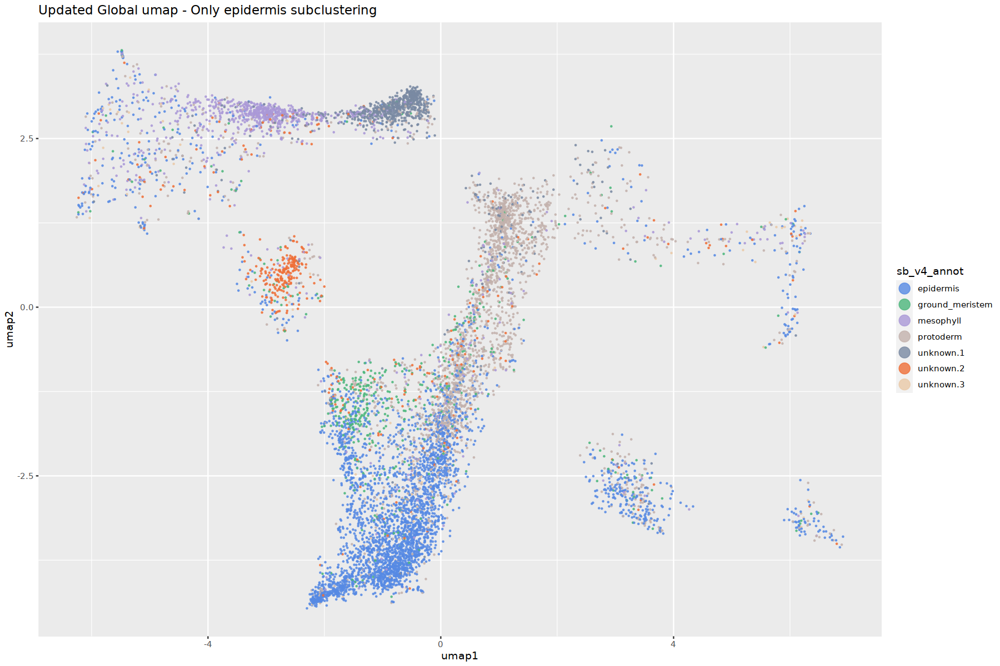

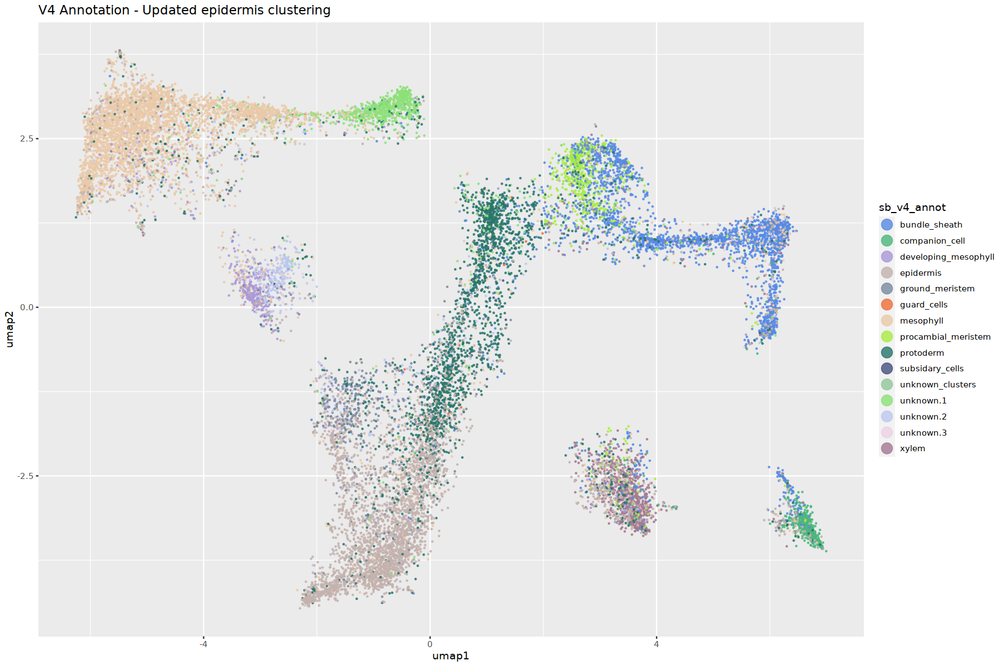

In [124]:
sb.subcluster_epidermis_updated_annotations <- sb.subcluster_epidermis.clean.clusters.final$epidermis_annot  %>% 
    dplyr::mutate(sb_v4_annot = sb_v4_annot.subcluster_v2)  %>% 
    mutate(across(c(LouvainClusters),factor))  %>% 
    dplyr::select(cellID, sb_v4_annot, sb_v4_annot.subcluster_v2, sb.epidermis_lc)


sb.subcluster_epidermis.final_meta <- sb.combined_meso.sb  %>% 
    dplyr::filter(cellID %in% sb.subcluster_epidermis_updated_annotations$cellID)  %>% 
    dplyr::select(-sb_v4_annot)  %>%
    left_join(., sb.subcluster_epidermis_updated_annotations, by = "cellID")  %>% 
    mutate(across(c(LouvainClusters),factor))
    

global_umap_only_epidermis <- ggplot(sb.subcluster_epidermis.final_meta, aes(x=umap1, y = umap2, color = sb_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Global umap - Only epidermis subclustering")

global_umap_only_epidermis


dim(sb.subcluster_epidermis_updated_annotations)
dim(sb.subcluster_epidermis.final_meta)
colnames(sb.subcluster_epidermis.final_meta)

`%ni%` <- Negate(`%in%`)

v4_annot_filtered_cells <- sb.combined_meso.sb  %>% 
    dplyr::filter(cellID %ni% sb.subcluster_epidermis.clean.clusters.final$epidermis_annot$cellID)  %>% 
    mutate(across(c(LouvainClusters),factor))


sb.combined_epidermis.sb <- bind_rows(v4_annot_filtered_cells, sb.subcluster_epidermis.final_meta)

updated_epidermis_annot_global <- ggplot(sb.combined_epidermis.sb, aes(x=umap1, y = umap2, color = sb_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("V4 Annotation - Updated epidermis clustering")

updated_epidermis_annot_global

In [126]:
write_delim(sb.combined_epidermis.sb, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/sb_annot_v4/Sb.leaf_annot.V4.meta.final.updated_meso_subclustering.updated_epi_subclustering.txt",
                       col_names = TRUE, quote = "none", delim = "\t")


prefix <- "Sb_leaf.merged_replicates.subclustering_epidermis.V4"
output_location <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/v4_annotation_refinment"
sb.subcluster_epidermis.clean.clusters.final$meta_final_post_annot_epidermis <- sb.combined_epidermis.sb
saveRDS(sb.subcluster_epidermis.clean.clusters.final, file = paste0(output_location,prefix,".rds"))


# Vasculature Re-clustering

In [172]:
# pausing 10/6/2022

In [11]:
sb.combined_epidermis.sb <- read.table("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/sb_annot_v4/Sb.leaf_annot.V4.meta.final.updated_meso_subclustering.updated_epi_subclustering.txt", header = TRUE)

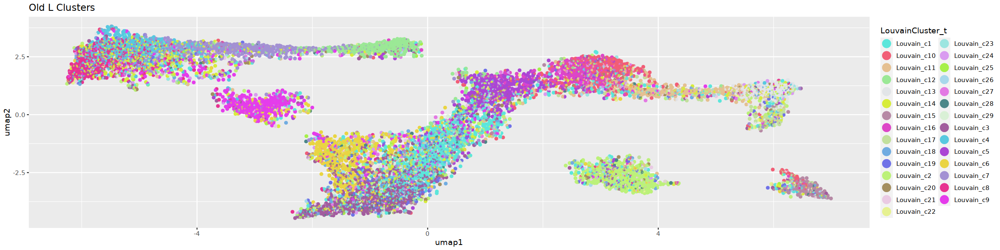

In [45]:
ggplot(sb.combined_epidermis.sb, aes(umap1, umap2, color = LouvainCluster_t)) + geom_point() +
 scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Old L Clusters")

In [56]:
options(repr.plot.width=15, repr.plot.height=15)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)

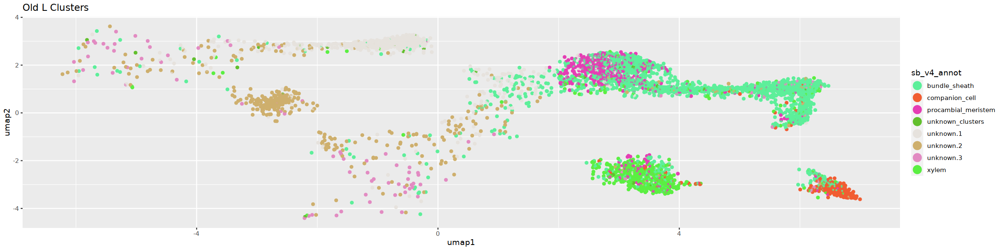

In [73]:
Sb.subcluster.vasculature <- Sb.subcluster
Sb.subcluster.vasculature$meta <- sb.combined_epidermis.sb


Sb.subcluster.vasculature$meta  %>% 
    filter(sb_v4_annot == "bundle_sheath" | sb_v4_annot ==  "xylem" |
          sb_v4_annot == "procambial_meristem" | sb_v4_annot ==  "companion_cell" |
          sb_v4_annot == "unknown_clusters" | sb_v4_annot ==  "unknown.1" |
          sb_v4_annot == "unknown.2" | sb_v4_annot ==  "unknown.3" )  %>% 
    ggplot(., aes(umap1, umap2, color = sb_v4_annot)) + geom_point() +
 scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Old L Clusters")

chosen_subcluster <- Sb.subcluster.vasculature$meta %>% 
    filter(sb_v4_annot == "bundle_sheath" | sb_v4_annot ==  "xylem" |
          sb_v4_annot == "procambial_meristem" | sb_v4_annot ==  "companion_cell" |
          sb_v4_annot == "unknown_clusters" | sb_v4_annot ==  "unknown.1" |
          sb_v4_annot == "unknown.2" | sb_v4_annot ==  "unknown.3" )

In [74]:
meta_df <- as.data.frame(chosen_subcluster)
rownames(meta_df) <- meta_df$cellID
Sb.subcluster.vasculature$meta <- meta_df
Sb.subcluster.vasculature$meta.v3 <- meta_df
Sb.subcluster.vasculature$acr <- read.table("/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/Sb.Louvain_cluster.iter_1/Sb.V3_annot.500bp_peaks.bed")

Sb.subcluster.vasculature <- generateMatrix(Sb.subcluster.vasculature, 
                                              filtered=FALSE,
                                              peaks = TRUE,
                                              organelle_scaffolds= c("Pt", "Mt"),
                                              blacklist = "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/sb_prelim.final_blacklist.bed",
                                              verbose=TRUE)

Sb.subcluster.vasculature <- convertSparseData(Sb.subcluster.vasculature, verbose = TRUE)

 - converting triplet format to sparseMatrix



In [75]:
# clean sparse counts matrix ---------------------------------------------
Sb.subcluster_vasculature.clean <- cleanData(Sb.subcluster.vasculature, 
                     min.c = 20,
                     min.t=0.02,  # minimum feature frequency across cells
                     max.t=0.3, # maximum feature frequency across cells
                     verbose=T)

   * Input: cells = 6140 | peaks = 69875

   * Filtered: cells = 6137 | peaks = 17333



In [76]:
# normalize with TFIDF ---------------------------------------------------
sb.subcluster_vasculature.clean <- tfidf(Sb.subcluster_vasculature.clean)

# project with NMF -------------------------------------------------------
sb.subcluster_vasculature.clean <- reduceDims(sb.subcluster_vasculature.clean,
                      method="SVD", 
                      n.pcs=50, 
                      num.var=6000,
                      doL2=TRUE,
                      svd_slotName="SVD")

# reduce to 2-dimensions with UMAP ---------------------------------------
sb.subcluster_vasculature.clean <- projectUMAP(sb.subcluster_vasculature.clean, 
                       verbose=T,
                       k.near=15,
                       m.dist=0.001,
                       svd_slotName="SVD")

library(randomcoloR)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)


# identify clusters using neighborhood graph -----------------------------
sb.subcluster_vasculature.clean.clusters <- callClusters(sb.subcluster_vasculature.clean, 
                        res=2,
                        k.near = 15,
                        min.reads=500,
                        verbose=T,
                        svd_slotName= "SVD",
                        cluster_slotName="sub_cluster_vasculature",
                        cleanCluster=FALSE)

 - non-linear dimensionality reduction with UMAP ...

12:06:12 UMAP embedding parameters a = 1.929 b = 0.7915

12:06:12 Read 6137 rows and found 49 numeric columns

12:06:12 Using Annoy for neighbor search, n_neighbors = 15

12:06:12 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:06:13 Writing NN index file to temp file /tmp/RtmpNw6pYW/file39d23119609fa

12:06:13 Searching Annoy index using 16 threads, search_k = 1500

12:06:13 Annoy recall = 100%

12:06:22 Commencing smooth kNN distance calibration using 16 threads
 with target n_neighbors = 15

12:06:25 Initializing from normalized Laplacian + noise (using irlba)

12:06:25 Commencing optimization for 500 epochs, with 141552 positive edges

12:06:47 Optimization finished

 - filtering outliers in UMAP manifold (z-

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6036
Number of edges: 307054

Running Louvain algorithm...
Maximum modularity in 100 random starts: 0.7197
Number of communities: 12
Elapsed time: 6 seconds


 - finished graph-based clustering ...

 - filtering clusters with low cell/read counts ...



In [64]:
colnames(sb.subcluster_vasculature.clean$meta)

[1] "cellID"                      "total"                      
 [3] "tss"                         "acrs"                       
 [5] "ptmt"                        "nSites"                     
 [7] "log10nSites"                 "pTSS"                       
 [9] "FRiP"                        "pOrg"                       
[11] "tss_z"                       "acr_z"                      
[13] "sites_z"                     "qc_check"                   
[15] "background"                  "cellbulk"                   
[17] "is_cell"                     "sampleID"                   
[19] "umap1"                       "umap2"                      
[21] "doubletscore"                "d.type"                     
[23] "LouvainClusters"             "LouvainCluster_t"           
[25] "louvain_clusters_sub"        "sb_v4_annot"                
[27] "sb_v4_annot.subcluster_v2"   "sb.mesophyll_lc"            
[29] "sb_v4_annot.subcluster_v2.x" "sb_v4_annot.subcluster_v2.y"
[31] "sb.epidermis_lc"

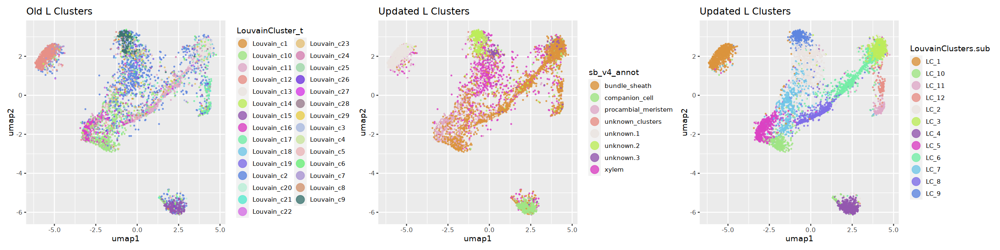

In [77]:
options(repr.plot.width=20, repr.plot.height=5)
old_clusters <- ggplot(sb.subcluster_vasculature.clean$meta, aes(x=umap1, y = umap2, color = LouvainCluster_t)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

safe_LC <- sb.subcluster_vasculature.clean.clusters$sub_cluster_vasculature   %>% 
    mutate(LouvainClusters.sub = str_c("LC", LouvainClusters, sep = "_"))


current_v4 <- ggplot(sb.subcluster_vasculature.clean$meta, aes(x=umap1, y = umap2, color = sb_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Updated L Clusters")

new_clusters <- ggplot(safe_LC, aes(x=umap1, y = umap2, color = LouvainClusters.sub)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Updated L Clusters")




old_clusters + current_v4 + new_clusters 

[1] "cellID"                          "total.x"                        
 [3] "tss.x"                           "acrs.x"                         
 [5] "ptmt.x"                          "nSites.x"                       
 [7] "log10nSites.x"                   "pTSS.x"                         
 [9] "FRiP.x"                          "pOrg.x"                         
[11] "tss_z.x"                         "acr_z.x"                        
[13] "sites_z.x"                       "qc_check.x"                     
[15] "background.x"                    "cellbulk.x"                     
[17] "is_cell.x"                       "sampleID.x"                     
[19] "umap1.x"                         "umap2.x"                        
[21] "doubletscore.x"                  "d.type.x"                       
[23] "LouvainClusters.x"               "LouvainCluster_t.x"             
[25] "louvain_clusters_sub.x"          "sb_v4_annot.x"                  
[27] "sb_v4_annot.subcluster_v2.x.x"   "sb.mesophyll_lc.x"              
[29] "sb_v4_annot.subcluster_v2.x.x.x" "sb_v4_annot.subcluster_v2.y.x"  
[31] "sb.epidermis_lc.x"               "total.y"                        
[33] "tss.y"                           "acrs.y"                         
[35] "ptmt.y"                          "nSites.y"                       
[37] "log10nSites.y"                   "pTSS.y"                         
[39] "FRiP.y"                          "pOrg.y"                         
[41] "tss_z.y"                         "acr_z.y"                        
[43] "sites_z.y"                       "qc_check.y"                     
[45] "background.y"                    "cellbulk.y"                     
[47] "is_cell.y"                       "sampleID.y"                     
[49] "umap1.y"                         "umap2.y"                        
[51] "doubletscore.y"                  "d.type.y"                       
[53] "LouvainClusters.y"               "LouvainCluster_t.y"             
[55] "louvain_clusters_sub.y"          "sb_v4_annot.y"                  
[57] "sb_v4_annot.subcluster_v2.y.y"   "sb.mesophyll_lc.y"              
[59] "sb_v4_annot.subcluster_v2.x.y"   "sb_v4_annot.subcluster_v2.y.y.y"
[61] "sb.epidermis_lc.y"               "LouvainClusters.sub"

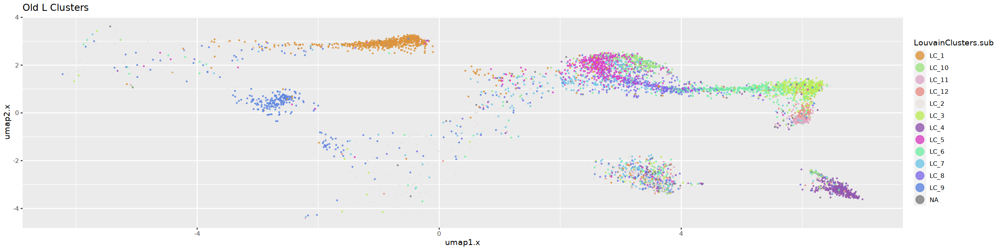

In [78]:
combined_old_new <- left_join(meta_df, safe_LC, by = "cellID")
colnames(combined_old_new)

old_umap_new_clusters <- ggplot(combined_old_new, aes(x=umap1.x, y = umap2.x, color = LouvainClusters.sub)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

old_umap_new_clusters

In [79]:
setwd("/scratch/jpm73279/comparative_single_cell/dev_location")
sb.subcluster_vasculature.clean.clusters$all_genes <- "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/Sbicolorv5.1.gene.bed"
#bed_intersections <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/zea_mays/Zm.all_mergeed_repds.unique.mpq10.tn5.sorted.bed"
genome_file <- "/home/jpm73279/genome_downloads/Sbicolor.v5.1.prelim.annot/Sorghum_bicolor_var_BTx623.mainGenome.MtPt.fasta.fai"
    
### Kernal Corrupted to just linked to the previosly run gene body accessability calculations
sb.subcluster_vasculature.clean.clusters.counts <- sb.subcluster_vasculature.clean.clusters
sb.subcluster_vasculature.clean.clusters.counts$acr_counts_raw <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/Sb.Louvain_cluster.iter_1/sb.gene_accessability.iter_1.scores.txt"



## Execute Annotation Attempt #1
library(presto)
sb.subcluster_vasculature.clean.clusters.final <- run_presto(sb.subcluster_vasculature.clean.clusters.counts,
           meta_slot = "sub_cluster_vasculature",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")

grabbed_top_marker_per_cluster <- top_markers(sb.subcluster_vasculature.clean.clusters.final$presto_marker, 50)

represented_marker_lst <- list()
for (i in unique(sb.subcluster_vasculature.clean.clusters.final$sub_cluster_vasculature$LouvainClusters)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(grabbed_top_marker_per_cluster, 
                                           marker_list_sb, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    represented_marker_lst[[i]] <- markers_present_in_presto
}
                 
represented_marker_lst

# A tibble: 6 × 31
  cellID       total   tss  acrs  ptmt nSites log10…¹  pTSS   FRiP   pOrg  tss_z
  <chr>        <int> <int> <int> <int>  <dbl>   <dbl> <dbl>  <dbl>  <dbl>  <dbl>
1 BC:Z:TGACCA… 13385  5363  4240   184   2175    3.34 0.401 0.317  0.0137 -0.312
2 BC:Z:TTAGGC…  9849  3274  1652   484   1018    3.01 0.332 0.168  0.0491 -0.519
3 BC:Z:TGACCA…  8537  2756  1941   378   1088    3.04 0.323 0.227  0.0443 -0.548
4 BC:Z:ACAGTG…  7988  2748  1620   511    970    2.99 0.344 0.203  0.0640 -0.484
5 BC:Z:ACAGTG…  6080  2484  1735   850    914    2.96 0.409 0.285  0.140  -0.288
6 BC:Z:TGACCA…  5768  1551   569   202    424    2.63 0.269 0.0986 0.0350 -0.712
# … with 20 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <int>,
#   background <dbl>, cellbulk <dbl>, is_cell <int>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   LouvainClusters <fct>, LouvainCluster_t <chr>, louvain_clusters_sub <chr>,
#   sb_v4_annot <chr>, sb_v4_annot.subcluster_v2 

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
13,Sobic.003G431900,Chr03,79824635,79828919,Zm00001eb140540_pval_0_bundle_sheath_ncell_2870,bundle_sheath_ncell_2870,leaf
20,Sorbiv5.1_pg30401.valid.m102.g,Chr09,52421823,52442425,Zm00001eb287770_pval_0_mesophyll_ncell_4541,mesophyll_ncell_4541,leaf
41,Sobic.003G036200,Chr03,3358317,3363996,me3_ortho_count_2,bundle_sheath,axillaryBud;leaf
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,Sobic.003G103701,Chr03,9292049,9364126,Zm00001eb126710_pval_0_xylem_ncell_336,xylem_ncell_336,leaf
15,Sobic.002G207900,Chr02,61233338,61239219,gl1,epidermis,axillaryBud;leaf;crownRoot;root
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>


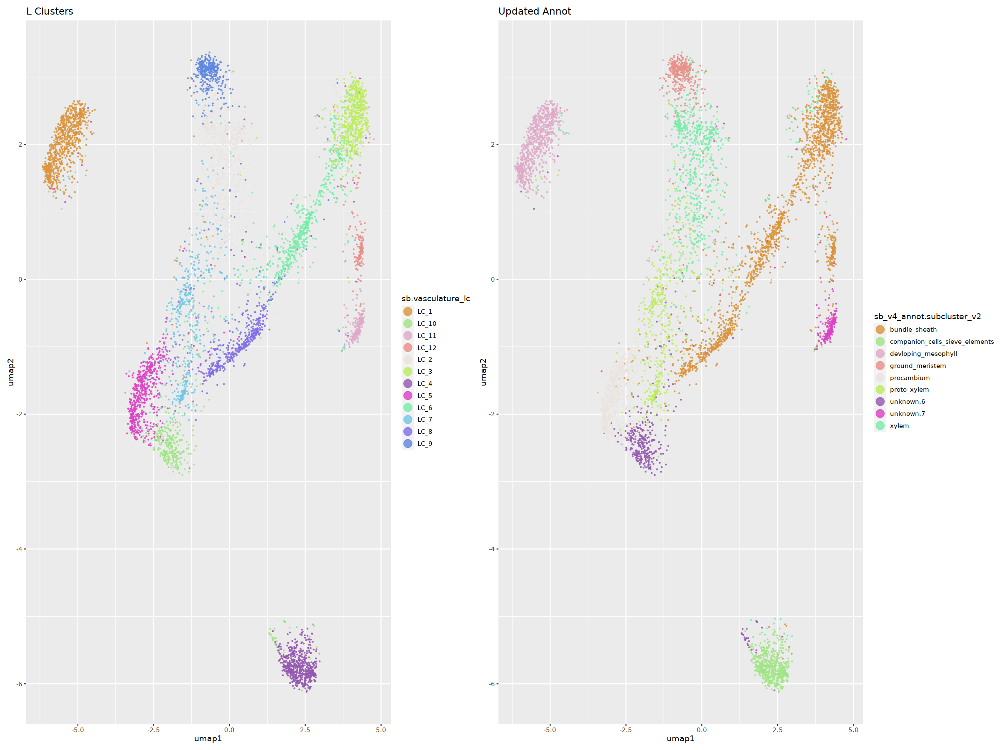

In [129]:
gathered_markers <- bind_rows(represented_marker_lst, .id = "LouvainCluster")  %>% 
    arrange(LouvainCluster, rank)

sb.vasculature_annot <- as_tibble(sb.subcluster_vasculature.clean.clusters.final$sub_cluster_vasculature)

sb.vasculature_sub_annot <- sb.vasculature_annot %>% 
    dplyr::mutate(sb.vasculature_lc = str_c("LC", LouvainClusters, sep = "_")) %>%     
    dplyr::mutate(sb_v4_annot.subcluster_v2 = NA)  %>% 
    dplyr::mutate(sb_v4_annot.subcluster_v2 = case_when(sb.vasculature_lc %in% c("LC_1") ~ "devloping_mesophyll",
                                                        sb.vasculature_lc %in% c("LC_2") ~ "xylem",
                                                        sb.vasculature_lc %in% c("LC_3") ~ "bundle_sheath",
                                                        sb.vasculature_lc %in% c("LC_4") ~ "companion_cells_sieve_elements",
                                                        sb.vasculature_lc %in% c("LC_5") ~ "procambium",
                                                        sb.vasculature_lc %in% c("LC_6") ~ "bundle_sheath",
                                                        sb.vasculature_lc %in% c("LC_7") ~ "proto_xylem",
                                                        sb.vasculature_lc %in% c("LC_8") ~ "bundle_sheath",
                                                        sb.vasculature_lc %in% c("LC_9") ~ "ground_meristem",
                                                        sb.vasculature_lc %in% c("LC_10") ~ "unknown.6",
                                                        sb.vasculature_lc %in% c("LC_11") ~ "unknown.7",
                                                        sb.vasculature_lc %in% c("LC_12") ~ "bundle_sheath",
                                                        TRUE ~ "unknown_clusters"))

LC_vasulature <- ggplot(sb.vasculature_sub_annot, aes(x=umap1, y = umap2, color = sb.vasculature_lc)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("L Clusters")

vasulature_annot <- ggplot(sb.vasculature_sub_annot, aes(x=umap1, y = umap2, color = sb_v4_annot.subcluster_v2)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Annot")

options(repr.plot.width=20, repr.plot.height=15)

LC_vasulature + vasulature_annot

In [130]:
sb.subcluster_vasculature.clean.clusters.counts$vasulature_annot <- sb.vasculature_sub_annot
sb.subcluster_vasculature.clean.clusters.final <- run_presto(sb.subcluster_vasculature.clean.clusters.counts,
           meta_slot = "vasulature_annot",
           counts_raw = "acr_counts_raw",
           cluster_name = "sb_v4_annot.subcluster_v2")

vasulature_sub_annot.top_markers <- top_markers(sb.subcluster_vasculature.clean.clusters.final$presto_marker, 200)

vasulature.sub_marker_list <- list()
for (i in unique(sb.subcluster_vasculature.clean.clusters.final$vasulature_annot$sb_v4_annot.subcluster_v2)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(vasulature_sub_annot.top_markers, 
                                           marker_list_sb, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    vasulature.sub_marker_list[[i]] <- markers_present_in_presto
}
                 
vasulature.sub_marker_list

# A tibble: 6 × 32
  cellID       total   tss  acrs  ptmt nSites log10…¹  pTSS   FRiP   pOrg  tss_z
  <chr>        <int> <int> <int> <int>  <dbl>   <dbl> <dbl>  <dbl>  <dbl>  <dbl>
1 BC:Z:TGACCA… 13385  5363  4240   184   2175    3.34 0.401 0.317  0.0137 -0.312
2 BC:Z:TTAGGC…  9849  3274  1652   484   1018    3.01 0.332 0.168  0.0491 -0.519
3 BC:Z:TGACCA…  8537  2756  1941   378   1088    3.04 0.323 0.227  0.0443 -0.548
4 BC:Z:ACAGTG…  7988  2748  1620   511    970    2.99 0.344 0.203  0.0640 -0.484
5 BC:Z:ACAGTG…  6080  2484  1735   850    914    2.96 0.409 0.285  0.140  -0.288
6 BC:Z:TGACCA…  5768  1551   569   202    424    2.63 0.269 0.0986 0.0350 -0.712
# … with 21 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <int>,
#   background <dbl>, cellbulk <dbl>, is_cell <int>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   LouvainClusters <fct>, LouvainCluster_t <chr>, louvain_clusters_sub <chr>,
#   sb_v4_annot <chr>, sb_v4_annot.subcluster_v2 

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
8,Sobic.003G036200,Chr03,3358317,3363996,me3_ortho_count_2,bundle_sheath,axillaryBud;leaf
9,Sobic.007G141200,Chr07,60395810,60403219,ccr1,vascular_sclerenchyma,axillaryBud;leaf;crownRoot;root;tassel;ear
14,Sobic.005G042000,Chr05,3935393,3936843,ssu2__ssu1,bundle_sheath,axillaryBud;leaf
21,Sorbiv5.1_pg30401.valid.m102.g,Chr09,52421823,52442425,Zm00001eb287770_pval_0_mesophyll_ncell_4541,mesophyll_ncell_4541,leaf
22,Sobic.003G431900,Chr03,79824635,79828919,Zm00001eb140540_pval_0_bundle_sheath_ncell_2870,bundle_sheath_ncell_2870,leaf
114,Sorbiv5.1_pg16697.valid.m8.g,Chr03,77005525,77009548,Zm00001eb144010_pval_0_bundle_sheath_ncell_2870,bundle_sheath_ncell_2870,leaf
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,Sobic.003G103701,Chr03,9292049,9364126,Zm00001eb126710_pval_0_xylem_ncell_336,xylem_ncell_336,leaf


In [131]:
gathered_markers <- bind_rows(vasulature.sub_marker_list, .id = "LouvainCluster")  %>% 
    arrange(LouvainCluster, rank)
gathered_markers


LouvainCluster,rank,geneID,chr,start,end,name,type,tissue
<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
bundle_sheath,8,Sobic.003G036200,Chr03,3358317,3363996,me3_ortho_count_2,bundle_sheath,axillaryBud;leaf
bundle_sheath,9,Sobic.007G141200,Chr07,60395810,60403219,ccr1,vascular_sclerenchyma,axillaryBud;leaf;crownRoot;root;tassel;ear
bundle_sheath,14,Sobic.005G042000,Chr05,3935393,3936843,ssu2__ssu1,bundle_sheath,axillaryBud;leaf
bundle_sheath,21,Sorbiv5.1_pg30401.valid.m102.g,Chr09,52421823,52442425,Zm00001eb287770_pval_0_mesophyll_ncell_4541,mesophyll_ncell_4541,leaf
bundle_sheath,22,Sobic.003G431900,Chr03,79824635,79828919,Zm00001eb140540_pval_0_bundle_sheath_ncell_2870,bundle_sheath_ncell_2870,leaf
bundle_sheath,114,Sorbiv5.1_pg16697.valid.m8.g,Chr03,77005525,77009548,Zm00001eb144010_pval_0_bundle_sheath_ncell_2870,bundle_sheath_ncell_2870,leaf
companion_cells_sieve_elements,23,Sorbiv5.1_pg2504.m1.g,Chr01,5624141,5644231,Zm00001eb059100_pval_0.053_metaphloem_sieve_element_ncell_114,metaphloem_sieve_element_ncell_114,leaf
companion_cells_sieve_elements,26,Sorbiv5.1_pg9337.valid.m3.g,Chr10,12450483,12454582,Zm00001eb280280_pval_0_vascular_parenchyma_ncell_1231,vascular_parenchyma_ncell_1231,leaf
companion_cells_sieve_elements,38,Sorbiv5.1_pg26238.m1.g,Chr02,19991876,19997282,hp2,protoxylem,axillaryBud;leaf;crownRoot;root;tassel;ear


In [122]:
str(sb.vasculature_sub_annot)

'data.frame':	6036 obs. of  32 variables:
 $ cellID                     : chr  "BC:Z:TGACCAGGCTACCAAAAGTTTCGAACA-Sorghum_leaf.sciATAC_rep1" "BC:Z:TTAGGCTAGCTTATTCCACTGATTCGG-Sorghum_leaf.sciATAC_rep1" "BC:Z:TGACCATAGCTTTGGATCGTACGGATG-Sorghum_leaf.sciATAC_rep1" "BC:Z:ACAGTGAGTCAATGTTTGTAGAGCGAG-Sorghum_leaf.sciATAC_rep1" ...
 $ total                      : int  13385 9849 8537 7988 6080 5768 5355 4780 4571 4412 ...
 $ tss                        : int  5363 3274 2756 2748 2484 1551 1377 945 1864 955 ...
 $ acrs                       : int  4240 1652 1941 1620 1735 569 467 227 922 311 ...
 $ ptmt                       : int  184 484 378 511 850 202 234 278 454 76 ...
 $ nSites                     : num  2175 1018 1088 970 914 ...
 $ log10nSites                : num  3.34 3.01 3.04 2.99 2.96 ...
 $ pTSS                       : num  0.401 0.332 0.323 0.344 0.409 ...
 $ FRiP                       : num  0.317 0.168 0.227 0.203 0.285 ...
 $ pOrg                       : num  0.0137 0.0491 0.0

[1] 6036    4

[1] 6036   33

[1] "cellID"                        "total"                        
 [3] "tss"                           "acrs"                         
 [5] "ptmt"                          "nSites"                       
 [7] "log10nSites"                   "pTSS"                         
 [9] "FRiP"                          "pOrg"                         
[11] "tss_z"                         "acr_z"                        
[13] "sites_z"                       "qc_check"                     
[15] "background"                    "cellbulk"                     
[17] "is_cell"                       "sampleID"                     
[19] "umap1"                         "umap2"                        
[21] "doubletscore"                  "d.type"                       
[23] "LouvainClusters"               "LouvainCluster_t"             
[25] "louvain_clusters_sub"          "sb_v4_annot.subcluster_v2.x"  
[27] "sb.mesophyll_lc"               "sb_v4_annot.subcluster_v2.x.x"
[29] "sb_v4_annot.subcluster_v2.y"   "sb.epidermis_lc"              
[31] "sb_v4_annot"                   "sb_v4_annot.subcluster_v2.y.y"
[33] "sb.vasculature_lc"

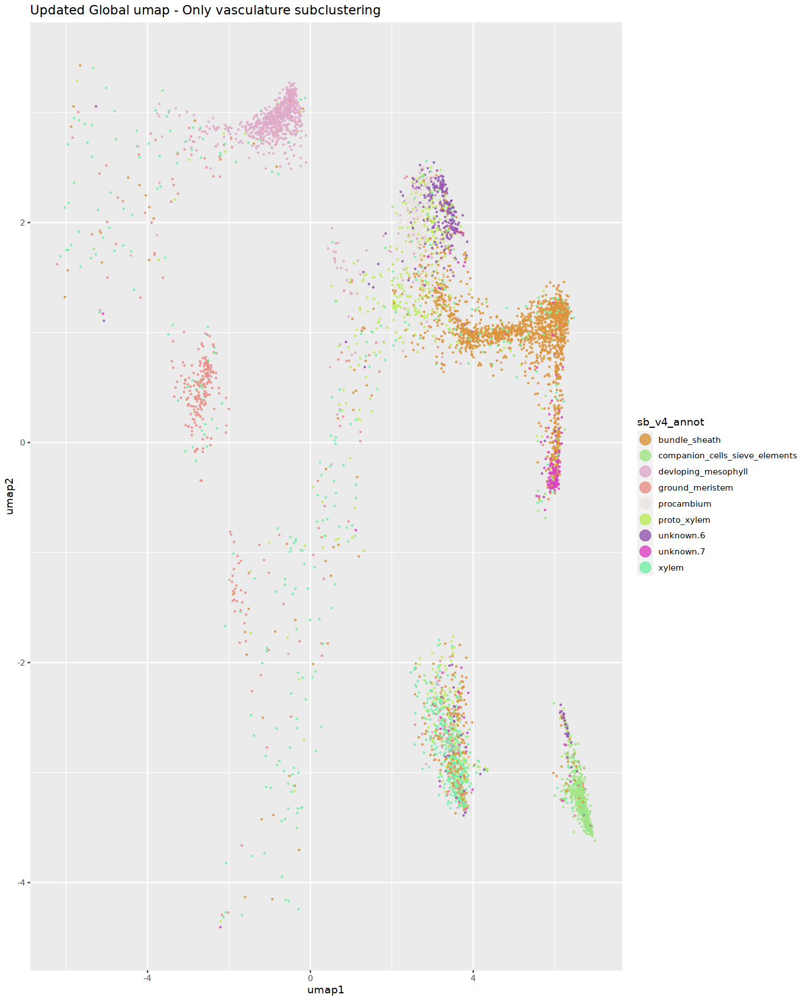

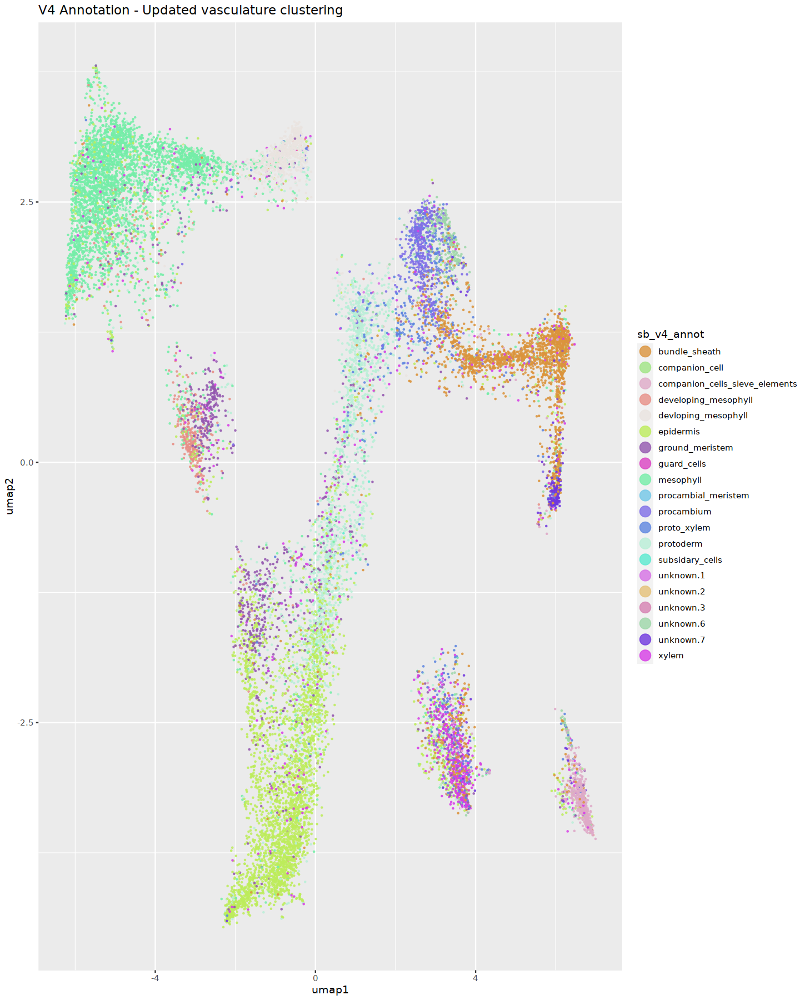

In [146]:
sb.subcluster_vasculature_updated_annotations <- sb.vasculature_sub_annot  %>% 
    dplyr::mutate(sb_v4_annot = sb_v4_annot.subcluster_v2)  %>% 
    mutate(across(c(LouvainClusters),factor))  %>% 
    dplyr::select(cellID, sb_v4_annot, sb_v4_annot.subcluster_v2, sb.vasculature_lc)


sb.subcluster_vasculature.final_meta <- sb.combined_epidermis.sb  %>% 
    dplyr::filter(cellID %in% sb.subcluster_vasculature_updated_annotations$cellID)  %>% 
    dplyr::select(-sb_v4_annot)  %>%
    left_join(., sb.subcluster_vasculature_updated_annotations, by = "cellID")  %>% 
    mutate(across(c(LouvainClusters),factor))
    
options(repr.plot.width=12, repr.plot.height=15)
global_umap_only_vasculature <- ggplot(sb.subcluster_vasculature.final_meta, aes(x=umap1, y = umap2, color = sb_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Global umap - Only vasculature subclustering")

global_umap_only_vasculature


dim(sb.subcluster_vasculature_updated_annotations)
dim(sb.subcluster_vasculature.final_meta)
colnames(sb.subcluster_vasculature.final_meta)

`%ni%` <- Negate(`%in%`)
v4_annot_filtered_cells <- sb.combined_epidermis.sb  %>% 
    dplyr::filter(cellID %ni% sb.subcluster_vasculature.final_meta$cellID)  %>% 
    mutate(across(c(LouvainClusters),factor))


sb.combined_vasculature.sb <- bind_rows(v4_annot_filtered_cells, sb.subcluster_vasculature.final_meta)

updated_vasculature_annot_global <- ggplot(sb.combined_vasculature.sb, aes(x=umap1, y = umap2, color = sb_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("V4 Annotation - Updated vasculature clustering")

updated_vasculature_annot_global

In [148]:
write_delim(sb.combined_vasculature.sb, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/sb_annot_v4/Sb.leaf_annot.V4.meta.final.updated_meso_subclustering.updated_epi_subclustering.updated_vasculature_subclustering.txt",
                       col_names = TRUE, quote = "none", delim = "\t")

prefix <- "Sb_leaf.merged_replicates.subclustering_vasculature.V4"
output_location <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/v4_annotation_refinment"
sb.subcluster_vasculature.clean.clusters.final$meta_final_post_annot_vasculature <- sb.vasculature_sub_annot
saveRDS(sb.subcluster_vasculature.clean.clusters.final, file = paste0(output_location,prefix,".rds"))

# 10/10/2022 - Final Annotation Assignments

In [5]:
# load libraries
library(dplyr)
library(Matrix)
library(RColorBrewer)
library(irlba) 
library(proxy)
library(png)
library(tidyverse)
library(ComplexHeatmap)
library(here)


working_dir <- "/scratch/jpm73279/comparative_single_cell/08.annotation_figures/sorghum_bicolor"
sb.v4_annotation <- here(working_dir,"00.data/Sb.leaf_annot.V4.meta.final.updated_meso_subclustering.updated_epi_subclustering.updated_vasculature_subclustering.txt")

In [7]:
colnames(sb.v4_annotation_read)

[1] "cellID"                        "total"                        
 [3] "tss"                           "acrs"                         
 [5] "ptmt"                          "nSites"                       
 [7] "log10nSites"                   "pTSS"                         
 [9] "FRiP"                          "pOrg"                         
[11] "tss_z"                         "acr_z"                        
[13] "sites_z"                       "qc_check"                     
[15] "background"                    "cellbulk"                     
[17] "is_cell"                       "sampleID"                     
[19] "umap1"                         "umap2"                        
[21] "doubletscore"                  "d.type"                       
[23] "LouvainClusters"               "LouvainCluster_t"             
[25] "louvain_clusters_sub"          "sb_v4_annot"                  
[27] "sb_v4_annot.subcluster_v2"     "sb.mesophyll_lc"              
[29] "sb_v4_annot.subcluster_v2.x"   "sb_v4_annot.subcluster_v2.y"  
[31] "sb.epidermis_lc"               "sb_v4_annot.subcluster_v2.x.x"
[33] "sb_v4_annot.subcluster_v2.y.y" "sb.vasculature_lc"

In [30]:
`%ni%` <- Negate(`%in%`)

renamed_cells <- c("companion_cell", "guard_cells", "procambial_meristem", "unknown.1", "unknown.2", "unknown.3", "subsidary_cells")
sb.v4_annotation_read <- read.delim(sb.v4_annotation)
sb.v4_annotation.updated  <- sb.v4_annotation_read %>% 
    dplyr::mutate(sb_v4_annot = dplyr::case_when(sb_v4_annot %in% renamed_cells ~ "NONE", 
                                          sb_v4_annot == "devloping_mesophyll" ~ "developing_mesophyll",
                                          sb_v4_annot == "unknown.6" ~ "phloem",
                                          TRUE ~ sb_v4_annot))


In [31]:
unique(sb.v4_annotation.updated$sb_v4_annot)

[1] "bundle_sheath"                  "developing_mesophyll"          
 [3] "xylem"                          "ground_meristem"               
 [5] "mesophyll"                      "epidermis"                     
 [7] "protoderm"                      "NONE"                          
 [9] "companion_cells_sieve_elements" "phloem"                        
[11] "unknown.7"                      "procambium"                    
[13] "proto_xylem"

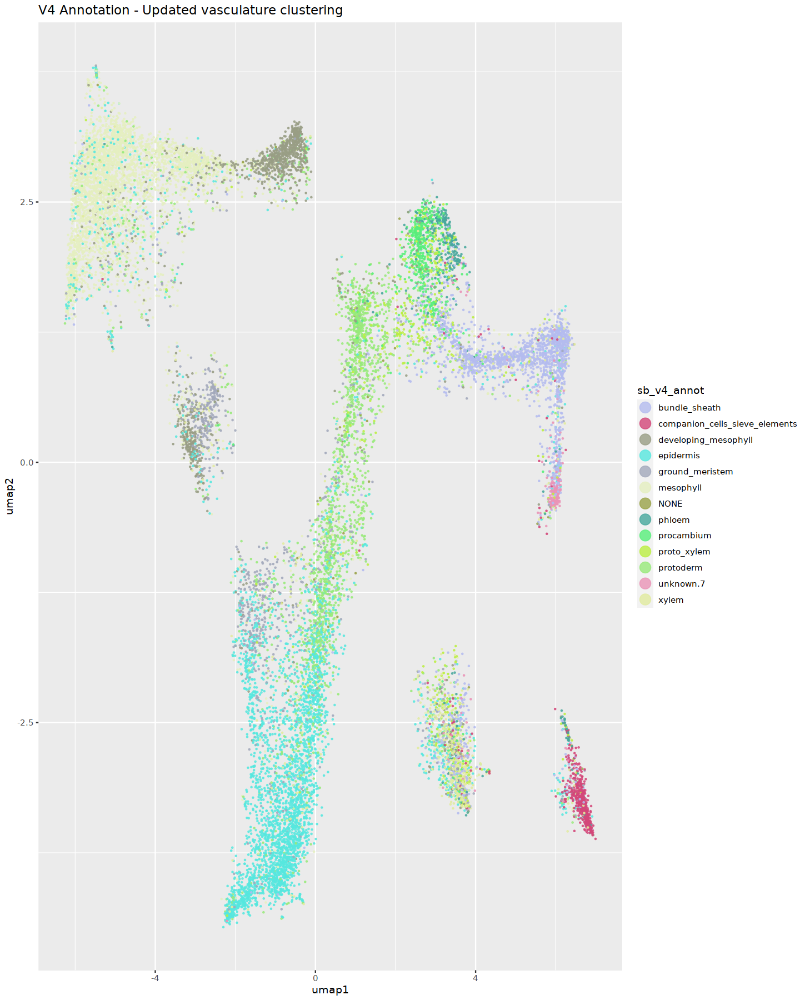

In [32]:

other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)

options(repr.plot.width=12, repr.plot.height=15)
ggplot(sb.v4_annotation.updated, aes(x=umap1, y = umap2, color = sb_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("V4 Annotation - Updated vasculature clustering")

In [18]:
library("symphony")

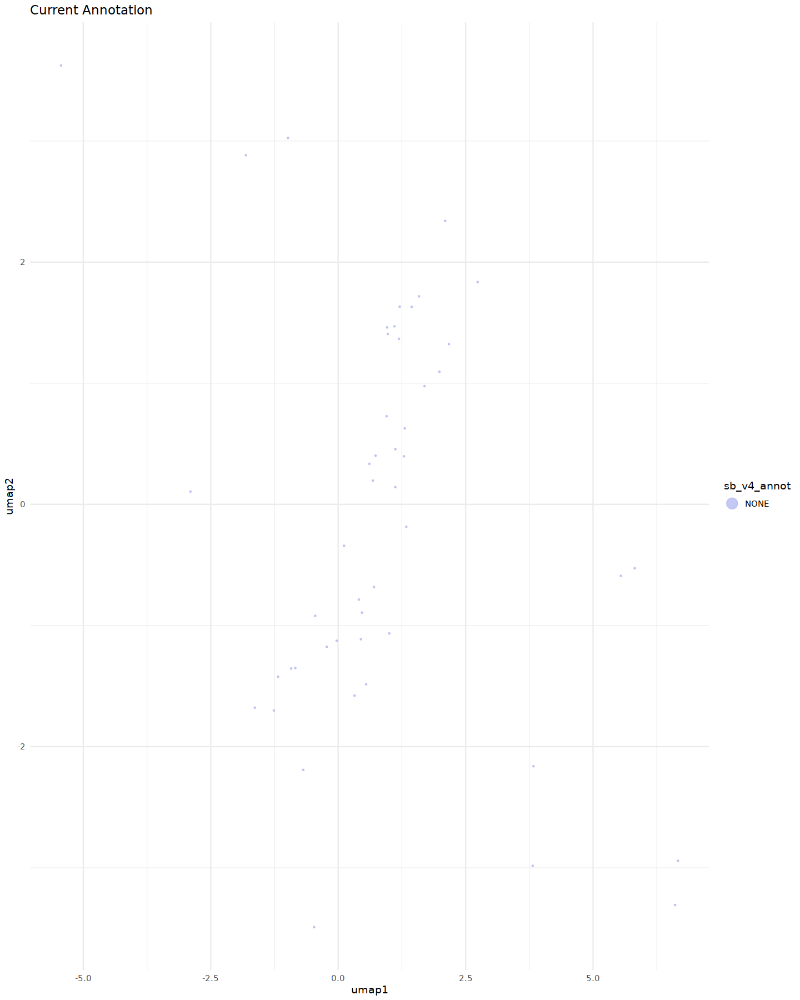

In [33]:
nas_left <- sb.v4_annotation.updated %>% 
  filter(sb_v4_annot == "NONE") %>% 
  ggplot(., aes(x=umap1, y = umap2, color = sb_v4_annot)) +
  scale_colour_manual(values=other)  + geom_point(size = .25, alpha = .8) + theme_minimal() + ggtitle("Current Annotation")  +
  guides(colour = guide_legend(override.aes = list(size=5)))

nas_left 


## Select down the cells to pull 
sb.v4.PCAs <- read.table("/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/clustering/Sb_leaf.merged_replicates.QC_V2.SVD.full.reduced_dimensions.txt")

sb.na_annots <- sb.v4_annotation.updated %>% 
    filter(sb_v4_annot == "NONE") 
sb.annot.v4 <- sb.v4_annotation.updated %>% 
    filter(sb_v4_annot != "NONE") 

annotate_PCAs <- sb.v4.PCAs[sb.annot.v4$cellID,]
non_annotated_PCAs <- sb.v4.PCAs[sb.na_annots$cellID,]


knn_pred = class::knn(annotate_PCAs, non_annotated_PCAs, sb.annot.v4$sb_v4_annot, k = 5, prob = TRUE)
knn_prob = attributes(knn_pred)$prob
sb.na_annots$sb_v4_annot <- knn_pred


sb.v4.final_annot_meta <- bind_rows(sb.na_annots, sb.annot.v4)

cluster_numbers <- sb.v4.final_annot_meta %>% 
  group_by(sb_v4_annot) %>% 
  summarise(total_cell_count = n())


sb_v4_annot.cell_counts <- left_join(sb.v4.final_annot_meta, cluster_numbers, by = c("sb_v4_annot")) %>% 
  mutate(v4_annotation_n = str_c(sb_v4_annot, total_cell_count, sep = "_ncell_"))



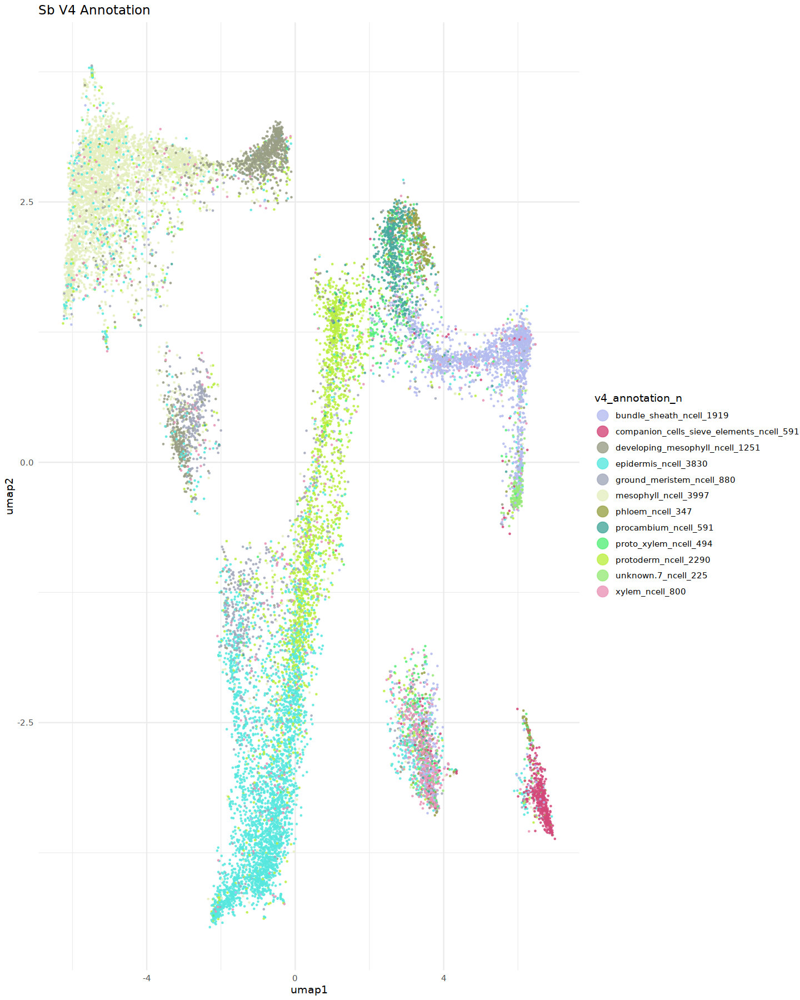

In [34]:
ggplot(sb_v4_annot.cell_counts, aes(x=umap1, y = umap2, color = v4_annotation_n)) +
  scale_colour_manual(values=other)  + geom_point(size = .25, alpha = .8) + theme_minimal() + ggtitle("Sb V4 Annotation")  +
  guides(colour = guide_legend(override.aes = list(size=5)))

In [36]:
write_delim(sb_v4_annot.cell_counts, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/sb_annot_v4/Sb.leaf_annot.V4.meta.final.2022-10-10.txt", 
            col_names = TRUE, quote = "none", delim = "\t")

# Removing Incorrect Xylem Annotation on 11/14/2022

In [16]:
sb.final_annotation <- read_delim("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/sb_annot_v4/Sb.leaf_annot.V4.meta.final.2022-10-10.txt")

final.sb.annotation <- sb.final_annotation  %>% 
    mutate(sb_v4_annot = case_when(sb_v4_annot == "xylem" ~ "epidermis",
             TRUE ~ sb_v4_annot))  %>% 
    dplyr::select(-v4_annotation_n)  %>% 
    dplyr::select(-total_cell_count)


cluster_numbers <- final.sb.annotation %>% 
  group_by(sb_v4_annot) %>% 
  summarise(total_cell_count = n())


sb_v4_annot.cell_counts.updated <- left_join(final.sb.annotation, cluster_numbers, by = c("sb_v4_annot")) %>% 
  mutate(v4_annotation_n = str_c(sb_v4_annot, total_cell_count, sep = "_ncell_"))



Rows: 17215 Columns: 36
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (15): cellID, sampleID, d.type, LouvainCluster_t, louvain_clusters_sub, ...
dbl (21): total, tss, acrs, ptmt, nSites, log10nSites, pTSS, FRiP, pOrg, tss...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


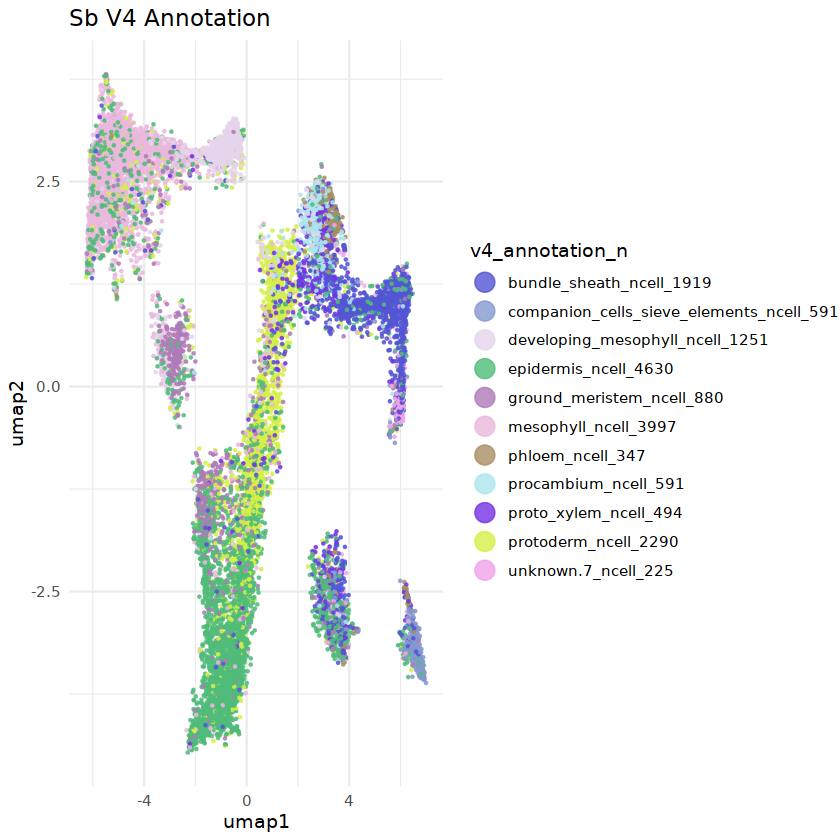

In [17]:
ggplot(sb_v4_annot.cell_counts.updated, aes(x=umap1, y = umap2, color = v4_annotation_n)) +
  scale_colour_manual(values=other)  + geom_point(size = .25, alpha = .8) + theme_minimal() + ggtitle("Sb V4 Annotation")  +
  guides(colour = guide_legend(override.aes = list(size=5)))

In [22]:
write_delim(sb_v4_annot.cell_counts.updated, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/sb_annot_v4/Sb.leaf_annot.V4.meta.final.2022-11-14.txt", 
            col_names = TRUE, quote = "none", delim = "\t")